# Assignment B - The Harry Potter Universe

## 1 Motivation:

For this project, we wanted to take a closer look at the Harry potter universe using the tool that we learned throughout the course. The Harry Potter series is one of the most popular book and movies series in recent years. 
The goal was to use the new tools to view known material through a different lens.
The datasets that we used for this project where are all the seven books of the series, the transcripts for all eight movies and a fan Wiki of the Harry Potter universe( http://harrypotter.wikia.com/wiki/Main_Page ).

For the books and movies we wanted to use sentiment analysis to compare and contrast their mood as well as see how the mood develops over time in the series.
We also wanted to use TF-IDF to find the most unique words for each book and compare the results to the major plot lines.
A network that captures the relationships between most of the characters from the Harry Potter universe was generated
from the fan Wiki and additionally each movie was turned into a network to contrast how the overall structure of the universe translates into the movies.

The goal for the end user's experience was to introduce the series through our findings from the fan Wiki and then compare and contrast it with the structure of the movies.
Finally we wanted to compare the development of the mood in both film and writing and present word clouds that capture the essence of each book and judge how well the most unique words for each book actually describe the overall plot lines.




## 2 Basic stats:

**The Books**

A member of the group owned the pottermore eBook containing all seven Harry Potter books that was converted into a text file and separated into the individual books and chapters, so we could easily work on it.

**The Movie Transcripts**

The movie scripts were collected as PDF files from various sources on the Internet and were likewise converted into
text documents. One of the scripts had a encoding and was particularly difficult to convert, but more on that later.
It was a nuisance to split the script into the separate scenes for several reasons. 
First of all, they didn't have uniform structures.
Three or four of the scripts were structured similarly and an attempt was made to divide them into scenes procedurally 
using regular expressions, but that attempt wasn't as fruitful as hoped and turned out to be more of an exercise in advanced regex than to help to solve the problem.
The resulting regex can be seen below

r"\n(\d+[A-Z]?)[^\.]?\n(.+?)(?=\n\d+[A-Z]?[^\.]?\n?)", re.MULTILINE | re.DOTALL| re.UNICODE

It was based on a pattern in the scripts where a new scene started with

1 //<-scene id

EXT. SOME PLACE IN THE MOVIE

1

RON

some sentence

Sadly upon further inspection it was revealed that this pattern had more that just a handful of exceptions mostly because of revisions in the script and inconsistencies from the pdf conversions. 
To not waste any further time on that issue we decided to manually insert a unambiguous string “_START OF NEW SCENE_ “ in front of each new scene for each of the scripts. 

The next problem was to find the characters in each of the scenes as the use of names was also inconsistent. Sometimes characters were referred to by only their first name or last name. 
In order to identify each character if only part name was provided, a list of all characters in the harry potter universe was collected https://www.hp-lexicon.org/characters/ which was used to build a dictionary that contained all first, middle and last names as a key and all the characters that share that name as the values. That dictionary was quite large and had to be filtered manually for the following things. Each name had to point to only one character. The name ALbus for example can refer to both Albus potter and Albus Dumbledore, but it is much likelier that it refers to the latter one. In some cases the name were also common English words like Oliver Wood who, in some cases, was referred to only Wood, but the word wood also appeared in some scenes where he wasn't present. Finally some names were simply shared by too many characters and had to be removed from the dictionary the name Weasley for example referred to too many important characters in order to estimate which of them was meant. Those ambiguous names had to be removed.
Luckily most of the characters in the movies had unique names and this technique could detect most of them, but there were some annoying exceptions. There were to characters with the name Ernie and in the last movie James potter and Lily potter could both refer to Harry's parents and children. In those cases the easiest solution was to find and replace those ambiguous names in the scripts to give them a unique suffix.

Finding all the exceptions was a tedious process where all the characters in the networks had to be inspected in order to find those who shouldn't be there and then handle those cases.

The movie networks required by far the most data clean up and processing, but in the end yields a good result.

As mentioned earlier, one of the scripts was particularly difficult to convert to a text document.
When we finally managed to do so, the resulting network had some obvious deviations in the node and edge count compared to the other scripts as can be seen below where there is a huge spice for Order or the Phoenix (the bad script) which broke with the underlying trend in the graph.

![bad series](../plots/badSeries.png)

Upon further inspection of the script it became apparent that it contained some major discrepancies from the actual movie and was in some parts more akin to a fan fiction. It felt wrong to work with this script as soon as the issues were revealed and one the the group members (credit to Tanya) was willing to take the list of subtitles and watch the movie to assign a character to each subtitle and manually divide the script into scenes based on the movie.
The resulting network fits far better in the trend of the series and was used for this project

![good series](../plots/goodSeries.png)




**The Wikia Fanbase**

The fan Wiki provides data dumps that contains the pages of a specific fan Wiki as a giant XML file. 
When reading through all the pages there isn't any obvious indication if the current page belongs to a character, object, place, etc. so in order to only look at the pages of each character the character list that was mentioned in the previous section was used. It worked alright, but some of the major characters, had slightly different names in the wiki dump which meant that those characters from the list who weren't found in the Wiki had to be accounted for manually.
Characters like Ron, Bill and Ginny Wealsey for example were named by their short names in the character list, but with their full name in the fan Wiki. 
The character list was far from perfect, but the most accessible large collection of characters that we could find.
It also contained some rather odd names, like all the families i.e. Weasley Family, Potter Family, Black Family, etc. 
as well as thing like headmaster and death, which were manually filtered out after those were detected in the resulting networks.
After all those issues were resolved by manually mapping out those exemptions that links between the characters and some basic information i.e. the house, blood status and loyalties of each character were extracted from the pages using regex.
Getting the actual character information presented itself more difficult than it should have been considering the, in theory, standardized structure of the info box. 
Many of the possible values for the blood type had many similar variations that in the end meant the same thing.
If a character for example was either a half-blood or pure-blood their blood status could have one of the following values:

- pure-blood or half-blood
- [[pure-blood]] or [[half-blood]] (possibly)
- [[pure-blood]] or [[half-blood]] (likely)
- pure-blood or [[half-blood]] (possibly)
- [[pure-blood|pure blood]] or [[half-blood]]
- [[half-blood]] or [[pure-blood]]
- [[pure-blood]] or [[half-blood]] {{c|most likely}}
- [[pure-blood]] or [[half-blood]] (most likely)
- please do not change the blood status for any of harry and ginny's children; the source defines pure-blood as having no known muggle or muggle-born parents or grandparents, and her paternal great-grandmother (lily) was muggle-born. [[half-blood]]
- [[pure-blood]] or [[half-blood]]
- [[half-blood]] or [[pure-blood]] (possibly)
- pure blood or half-blood
- [[pure-blood]] or [[half-blood]] (presumed)
- [[pure-blood]] or [[half-blood]] {{c|possibly}}

and that doesn't even account for all the different variations of capitalization and double spaces and obscure references that could follow the displayed values.
In order to be sure, all those variations were mapped out manually meaning that in this case all those values boiled down to: "pure-blood or half-blood".


### Files Sizes and Dimensions

**The database dump of the Harry Potter fandom wikia page**
- 15,728 pages
- 273 MB of data
- 5.086.137 lines of XML

**The books and movie transcripts:**
- 7 Books - 22,8 MB 
- 8 Movie scripts - 4,8 MB

**Character list**
- 1969 characters



## 3 Tools, theory and analysis

The books are opened, and as they lie in one huge file, the file is split into each book. A list is produced using the split() function to separate the books further into chapters and the Regular Expressions module to find all dialog(), aka. any string between “ ”, the regex used to isolate these sting is r'\“([\s\S]*?)\”'. 

The module Natural Language ToolKit ( NLTK) was used to import a list of English stopwords, to which the word “said” was added as we had observed that it was said so often that it sometimes interfered in some of our tests. A function tolist() was made to clean unicode issue that may be encountered when working with the text. 	The function sentiment() takes a list of tokens and calculates the sentiment using the happiness average values given in the course. All this, alongside tokenizing functions using NLTK, was used to calculate the sentiment of the books, the dialog from each chapter and each chapter as a whole. The TF-IDF and word cloud generators from previous assignments in the course was used to create word clouds for each book. In the end the sentiment was also calculated for each scene in the movie to see how it changes.


**Regular Expressions** have been essential as it became quite apparent that dialog seemed to illustrate the “mood” of the text better than the whole text. We believe this might be due to all the descriptive sections in books.

**NLTK** was used throughout the whole text analysis for its ease in processing text and build-in functions.

**Wiki Network**
For the network that is based on the fan Wiki, we used the references from a characters page to other characters to generate a directed graph, in contrast to the undirected movie networks.
The links to other characters and basic information about the characters i.e. blood status, house and loyalties were extracted from the pages using regular expressions and stored in a dictionary.
The network was analyzed in regards to the degree distribution which showed a power law in the Wiki network that is typical for scale-free networks such as social networks. 

Different centrality measures like the in degree, out degree, betweenness centrality and eigenvector centrality were used to determine the most important characters in the Harry Potter universe. Unsurprisingly the main characters are constantly on top of the charts. The only truly surprising results comes with the betweenness centrality where minor characters like
Rita Skeeter, Gellert Grindelwand are suddenly relevant as are links between important character.
Horace Slughorn and Arthur Weasley are also higher in betweenness centrality compared to the other measures. Horace is known for his networking and Arthur, as an employee of the Ministry of Magic in a higher positions and friend of Harry Potter and member of the Order of the Phoenix, is also fairly well networked.
Some of the character's love for Quidditch as a Spectator sport also shines through as Gwenog Jones, a famous Quidditch player, appears among the 20 most connected nodes for betweenness centrality but not for any other measure.

Communities in the Wiki network were found using the Louvain community algorithm. The network contains a dozen of smaller cliques, containing very minor characters, that are connected to the center through only one link. They look branches with a few buds on the end and most of them ended up in their own small communities.
As for the communities in the center of the network, it appears that the families seem to be the best predictor for community membership, at least for the nodes with the highest degrees in each community. They also contain some lesser known where the relation of the major families in the node isn't that obvious.
As a result the three main characters aren't in the same community, which is a surprise compared to the movie networks where the constantly are within the same community.

**Movie Networks**
For the movie networks the main goal was to map out the characters that appear in each movie including their relationships. A challenge of creating networks from text is to divide text into appropriately sized chunks that capture the true social structure. 
In our case the scripts were already divided into scenes which contain the characters in their natural environments, capturing their social structure.
In addition to mapping out the relationships between the characters one goal was also to find the most relevant characters for each movie.
Finally we also wanted to use community detection to determine in the cliques that were captured through the movie network also align with some of the known cliques from the Harry Potter universe.

As the scripts varied in structure, it was quite difficult to determine which character spoke in each scene, which ones were only mentioned by the talking characters and the ones that were only mentioned in stage directions. For that reason an undirected network was used, where edges were added between all characters that were mentioned in some form during a scene.
In order to find all characters in a scene, the scenes where word tokenized and each word that had a match in the character name dictionary, which was described in the previous section, was added to the network. Because not all characters could be found using just part of their names, as stored in the dictionary, a list of known exception strings was also tested for each scene to find characters like Oliver Wood of to find ambiguous characters like Ernie Prang and Ernie Macmillan.
One drawback of this method can be seen in some minor characters that only are mentioned in only one scene, but one that contains a lot of important characters. In order to combat that, the number of scenes a characters appears in was also factored in.
As the movie networks are undirected, we relied on the node degrees to determine the importance of the characters and was also used to scale the size of the node to illustrate the importance in the network plots.
The resulting graphs seem to capture the know structures rather well as known families with minor roles are somewhat isolated and far from the center while the major characters are in the center together with a noticeably higher degree than the minor characters.
The node degrees were also used to analyze the relevance of each character over time.
Which also showed that the major characters were consistently among the most connected nodes while some minor characters that were only relevant for one movie had a high degree in only that case.
The degree distribution was used illustrate how common the several node degrees were show that the main characters had a significantly higher degree that most minor characters.

The node and edge counts of the networks were used to illustrate the development of the network dimensions over time with the surprising result that number of nodes and edges actually dips down in the middle of the series and rises again towards the end. Also the number of nodes and edges some had some linear relation apart from the final movie that breaks this rend.

Communities were detected using Louvain Community detection with mixed results. Some communities were nicely made up of known groups like the Dursley or the Weasley, while some were looked rather random, but the movie contains fights between opposing parties, it’s not surprising that the separation of the known groups isn’t always very clear.
A heatmap was used to show the composition of each community in relation to the most important known communities like the Houses, Muggles, Order of the Phoenix / Dumbledore’s Army, and the Death Eaters.


## 3.1 Network Analysis

In [1]:
import re
import json
from nltk.tokenize import RegexpTokenizer, word_tokenize
import networkx as nx
import matplotlib.pyplot as plt
from collections import namedtuple, defaultdict, Counter
from __future__ import division
from math import log, ceil
from operator import itemgetter
from fa2 import ForceAtlas2 as FA2
import community
import numpy as np
import seaborn as sn
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk import FreqDist
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import io 
from scipy import stats
import unicodedata
from nltk.stem.porter import *
from nltk.draw.dispersion import dispersion_plot
import os.path
import xml.etree.cElementTree as etree
from bs4 import BeautifulSoup
import requests

## 3.1 Function Definitions

In [2]:
gryffindor = "#CE0E00"
slytherin = "#009403"
hufflepuff = "#FFCA52"
ravenclaw = "#6596BF"
muggle = "#cccccc"
default = "#4e0333"
order= "#fa5b0b"
deatheater = "#002f01"

In [3]:
save_plots = False

In [4]:
movie_data = namedtuple('movie', 'scenes, occurrences')

In [5]:
word_tokenizer = RegexpTokenizer(r'(\w+[-|\']?\w*)')

In [6]:
def script_to_secnens_dict(file_name):
    script = open(file_name,"r").read().decode("utf-8")
    scenes = defaultdict(str)
    matches = regex.finditer(script)
    for match in matches:
        sceneId = match.group(1)
        dialog = match.group(2)
        scenes[sceneId] += dialog
    return scenes

In [7]:
def process_script(script, tokenizer, name_mappings, special_cases=[], ignore=[]):
    occurrences = defaultdict(set)
    #divide script into scenes ignore the title, introduction, revisions, etc. 
    scenes = script.split("_START OF NEW SCENE_")[1:]
    
    for index, scene in enumerate(scenes):
        text = scene.lower()
        tokens = tokenizer.tokenize(text)

        for key, name in special_cases.iteritems():
            if key in ignore:
                continue
            elif key in scene:
                occurrences[index].add(special_cases[key])

        for token in tokens:
            if token in ignore:
                continue
            elif name_mappings.has_key(token):
                occurrences[index].add(name_mappings[token][0])
    
    return movie_data(scenes=scenes, occurrences=occurrences)

In [8]:
def total_occurences(occurences, character):
    return sum(1 for characters in occurences.values() if character in characters)

In [9]:
def generate_movie_network(occurrences):
    network = nx.Graph()
    for scene, characters in occurrences.iteritems():
        for character in characters:
            network.add_node(character)
            for other in characters:
                if character != other:
                    if network.has_edge(character, other): # if the edge already exists
                        network[character][other]['weight'] += 1 # increase the edge weight
                    else:
                        network.add_edge(character, other, weight=1) # if edge does not exists, make it
    return network

In [10]:
def display_network(G, pos, size_map=300, color_map = "red", save=False, file_name="image", node_lables=None, show_labels=True):
    disp_color = "black"
    plt.figure(figsize=(20,20))
    plt.axis("off")
    nx.draw_networkx(
        G, 
        pos = pos,
        alpha=0.65, 
        labels = node_lables,
        with_labels=show_labels, 
        edge_color="black", 
        node_size=size_map, 
        node_color=color_map,
        font_color=disp_color,
        font_weight="bold"
    ) 
    if save:
        print "saving"
        plt.tight_layout()
        plt.savefig("../plots/networks/" + file_name + ".png", format="PNG", transparent=True, bbox_inches = "tight")

In [11]:
# calling the method above gives errors for wiki networks when with labels is false
def display_network_no_lables(G, pos, size_map=300, color_map = "red", save=False, file_name="wikiNet"):
    disp_color = "black"
    plt.figure(figsize=(20,20))
    plt.axis("off")
    nx.draw_networkx(
        G, 
        pos = pos,
        alpha=0.65, 
        with_labels=False, 
        edge_color=disp_color, 
        node_size=size_map, 
        node_color=color_map,
        font_color=disp_color,
        font_weight="bold"
    ) 
    if save:
        print "saving"
        plt.tight_layout()
        plt.savefig("../plots/networks/" + file_name + ".png", format="PNG", transparent=True, bbox_inches = "tight")

In [12]:
def generate_node_color(character, info_dict):
    try:
        house = info_dict[character]["house"]
        blood = info_dict[character]["blood"]
        loyalty = info_dict[character]["loyalty"]
        if house == "gryffindor":
            return gryffindor
        elif house == "slytherin":
             return slytherin
        elif house == "hufflepuff":
             return hufflepuff
        elif house == "ravenclaw":
             return ravenclaw
        elif blood == "muggle":
            return muggle
        else:
            return default
    except:
        return "#00DFF7"

In [13]:
def generate_node_color_good_evil(character, info_dict):
    try:
        house = info_dict[character]["house"]
        blood = info_dict[character]["blood"]
        loyalty = info_dict[character]["loyalty"]
        if "order of the phoenix" in loyalty or "dumbledore's army" in loyalty:
             return order
        elif "death eaters" in loyalty or "lord voldemort" in loyalty:
             return slytherin
        else:
            return default
    except:
        return "#00DFF7"

In [14]:
def genrate_color_series(N):
    #4522
    np.random.seed(4569)
    colors = []
    for n in xrange(N):
        color = list(np.random.choice(range(256), size=3))
        colors.append('#%02x%02x%02x' % tuple(color))
    return colors

In [15]:
def debug_characters_in_scenes(movie, sceneId):
    print movie.occurrences[sceneId], movie.scenes[sceneId]

In [16]:
def debug_scenes_by_character(movie, name):
    for scene, character in movie.occurrences.iteritems():
        if  name in character:
            print movie.scenes[scene]

In [17]:
def save_as_json(data, file_name):
    with open("./" + file_name + ".json", 'w') as f:
        f.write(json.dumps(data))

In [18]:
def plot_networks_over_time(nodes, edges, lables, save=False, file_name="plot"):
    disp_color = "black"
    fig = plt.figure()

    x = range(len(labels))
    y1 = nodes
    y2 = edges

    fig, ax1 = plt.subplots()
    #plt.ylim(30,140)

    color = gryffindor
    ax1.spines['top'].set_visible(False)
    ax1.tick_params(axis='y', labelcolor=disp_color, color=disp_color)
    ax1.tick_params(axis='x', colors=disp_color)
    ax1.yaxis.label.set_color(disp_color)
    ax1.xaxis.label.set_color(disp_color)
    ax1.spines['bottom'].set_color(disp_color)
    ax1.spines['left'].set_color(disp_color)
    ax1.spines['top'].set_color(disp_color)
    ax1.spines['right'].set_color(disp_color)
    ax1.set_ylabel('nodes', color=color)
    ax1.plot(x, y1, color=color)

    plt.xticks(x, labels,rotation=90)
    
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = ravenclaw
    ax2.spines['top'].set_visible(False)
    ax2.spines['bottom'].set_color(disp_color)
    ax2.spines['left'].set_color(disp_color)
    ax2.spines['top'].set_color(disp_color)
    ax2.spines['right'].set_color(disp_color)
    ax2.set_ylabel('edges', color=color)  # we already handled the x-label with ax1
    ax2.plot(x, y2, color=color)
    ax2.tick_params(axis='y', labelcolor=disp_color, color=disp_color)

    plt.xticks(rotation=90)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    if save:
        plt.savefig("../plots/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    plt.show()
    

In [19]:
def display_degree_series(x, y, title, color, labels, save=False, file_name="image"):
    disp_color = "black"
    fig = plt.figure()#(figsize=(8,20))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.plot(x,y, marker="o", color=color)
    plt.title(title)
    plt.xlim(-1,len(labels))
    plt.ylim(0,max(y)+10)
    plt.xticks(range(len(labels)), labels, rotation=90)
    plt.ylabel("Degree")
    plt.tight_layout()
    if save:
        plt.savefig("../plots/degrees/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")
    plt.show()

In [20]:
def generate_colors(partitions):
    color_map = {}
    colors = ["#1676B6", "#FF7F00", "#24A121", "#D8241F", "#FFFF99", "#BDAED4"]
    for partition in partitions:
        color_map[partition] = colors[partition]
    return color_map

In [21]:
def analyze_communities(partitions, info_dict):
    matrix = [[0 for x in range(len(set(partitions.values())))] for y in range(9)]
        
    for character, community_id in partitions.iteritems():
        house = info_dict[character]["house"]
        blood = info_dict[character]["blood"]
        loyalty = info_dict[character]["loyalty"]
        
        matrix[0][community_id] = sum([1 for c in partitions.itervalues() if c == community_id])
        if house == "gryffindor":
            matrix[1][community_id] +=1
        if house == "slytherin":
            matrix[2][community_id] +=1
        if house == "hufflepuff":
            matrix[3][community_id] +=1
        if house == "ravenclaw":
            matrix[4][community_id] +=1
        if blood == "muggle":
            matrix[5][community_id] +=1
        if "death eaters" in loyalty or "lord voldemort" in loyalty:
            matrix[6][community_id] +=1
        if "order of the phoenix" in loyalty:
            matrix[7][community_id] +=1
        if "dumbledore's army" in loyalty:
            matrix[8][community_id] +=1
            
    return matrix   

In [22]:
def display_community_heatmap(matrix, save=False, file_name="heatmap", color_map="PuBu"):
    disp_color = "black"
    df_cm = pd.DataFrame(matrix, index = [i for i in ["total size", "gryffindor",  "slytherin", "hufflepuff", "ravenclaw", "muggle", "death eater", "order of the phoenix", "dumbledore's army"]],
                  columns = [i for i in range(len(set(partitions.values())))])
    plt.figure()#figsize = (30,2))
    plt.tight_layout()
    axis = sn.heatmap(df_cm, annot=True, cmap=color_map, annot_kws={"rotation":0},cbar=True, fmt="d")
    cbar = axis.collections[0].colorbar
    cbar.ax.yaxis.set_tick_params(color=disp_color)
    cbar.ax.tick_params(axis='y', colors=disp_color)
    cbar.set_label("Characters/Category", color=disp_color)
    axis.set_xlabel("Community Id")
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    #cbar.yaxis.label.set_color('white')
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    if save:
        plt.savefig("../plots/networks/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")
    plt.show()

In [23]:
def display_degree_destribution(degrees, save=False, file_name="degreeDist"):
    disp_color = "black"
    degree_sequence = sorted([d for n, d in degrees], reverse=True)
    degreeCount = Counter(degree_sequence)
    deg, cnt = zip(*degreeCount.items())

    fig = plt.figure(1)
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.bar(deg, cnt, width=0.80, color=ravenclaw)
    plt.xlabel('Degree')
    plt.ylabel('Number of nodes')
    plt.tight_layout()
    if save:
        plt.savefig("../plots/distributions/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    fig = plt.figure(2)
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color, which='both')
    axis.tick_params(axis='y', colors=disp_color, which='both')
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.loglog(deg, cnt, marker ="o", lw=0, color=ravenclaw)
    plt.xlabel('degree')
    plt.ylabel('number of nodes')
    plt.tight_layout()
    if save:
        plt.savefig("../plots/distributions/" + file_name + "LogLog" + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    plt.show()


In [24]:
def display_in_out_destribution(in_degrees, out_degrees, save=False, file_name="inOutDist"):
    disp_color = "black"
    fig = plt.figure(3)
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.scatter(in_degrees,out_degrees, color= ravenclaw)
    plt.xlabel("In degree")
    plt.ylabel('Out degree')
    if save:
        plt.savefig("../plots/distributions/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")
    plt.show()

In [25]:
def clean_link(link):
    split = re.split(r'[|]+', link)
    return split[0]

In [26]:
def parse_Infobox(text):
    blood = re.search(r"\|blood\s*=(.*?)\n\|", text, flags=re.DOTALL)
    if blood:
        blood = blood.groups()
    else:
        blood = ("none",)
    house = re.search(r"\|house\s*=\s*\[\[([\w-]+)\]]", text)
    if house:
        house = house.groups()
    else:
        house = ("none",)
    loyalty = re.search(r"\|loyalty\s*=(.*?)\}\}", text, flags=re.DOTALL)
    if loyalty:
        loyalty = loyalty.groups()
    else:
        loyalty = ("none",)
    return(blood, house, loyalty)

In [27]:
def process_dump(file_name):
    namespacestr = '{http://www.mediawiki.org/xml/export-0.10/}'
    namespace = {'mw': 'http://www.mediawiki.org/xml/export-0.10/'}
    character_links = {}
    character_info = {}
    for i , (event, elem) in enumerate(etree.iterparse(file_name, events=('start', 'end', 'start-ns', 'end-ns'))):
        # In case that we find tag <page> we continue
        if event == 'end' and elem.tag == namespacestr + 'page':
            # search for tag <title> inside tag <page>
            title = elem.find('.//mw:title', namespace)
            if title is not None: 
                # save text of the title
                title = title.text.lower()
                # skip if the page is not for one of the characters
                if title not in character_set:
                    continue
                # search for tag <text> inside tag <page> 
                text_elem = elem.find('.//mw:text', namespace)
                # tag text exist and is not empty and does not contain world from blacklist
                if text_elem is not None and text_elem.text is not None:
                    wiki_text = text_elem.text.lower()
                    text = wiki_text
                
                    #skip if the page is a redirect page
                    if "#redirect" in wiki_text:
                        continue
                    
                    blood, house, loyalty = parse_Infobox(wiki_text)
                    character_info[title] = {
                        "blood":blood,
                        "house":house,
                        "loyalty": loyalty
                    }
                    link_list = []
                    # find all links in article
                    for link in re.findall(r'\[\[(.*?)\]\]',wiki_text):
                        clean = clean_link(link)
                        if clean in character_set:
                            link_list.append(clean)
                    # get metadata from article                  
                    character_links[title]=link_list   
                                          
                        
    return character_links, character_info

In [28]:
def parseLoyalty(loyalty):
    if "[[" in loyalty:
            return re.search(r"\[\[(.*?)\]\]", loyalty).groups()[0].lower()
    else:
        return loyalty.lower()

## 3.1 Data Cleaning and Preparation

In [29]:
if os.path.exists("../characters.json"):
    with open("../characters.json") as characters_json:
        characters = json.load(characters_json)
else:
    print "false"
    # collect list of all known harry potter characters
    base_url = "https://www.hp-lexicon.org/character/?letter="
    outfile = "./characters.json"
    #download for all letters
    pages = [ base_url + letter for letter in string.ascii_uppercase ]
    characters = []

    for page in pages:
        r = requests.get(page)
        r.encoding = 'utf-8'
        page_html = r.content
        soup = BeautifulSoup(page_html, 'html.parser')
        headings = soup.find_all('span',{'itemprop':'headline'})
        for heading in headings:
            characters.append(heading.getText())
            print(heading.getText())
        print("Downloaded {:s}".format(page))

    save_as_json(characters, outfile)

In [30]:
# find all name collisons where characters share part of their names. this is important for the movie network as
# many times a character is only referred to by first or last name
for character in characters:
    names = character.split(" ")
    #only very strange characters, that are irellevant for the movies have
    #very long names
    shared_names = defaultdict(list)
    if len(names)  > 4:
        for name in names:
            shared_names[name].append(name)
            
#save for manual filtering        
#save_as_json(shared_names, "nameDict2")  

In [31]:
#requires wiki dump in same directory
fandomDump = 'harrypotter_pages_current.xml'
character_set = set(map(lambda x: x.lower(), characters))

In [32]:
character_links, character_info = process_dump(fandomDump)
# detec the characters from the characterlist that werent't found in the wiki
found_characters = set(character_info.keys())
for character in character_set:
    if character not in found_characters:
        print character

sgt. fisher
mrs. finch-fletchley
male student who accidentally transfigured his friend into a badger
mrs. diggory
wand-shine elf
bob, bill, and barnaby ollerton
mrs fudge
king arthur
avery
goyle sr.
mr. payne
roger davies' girlfriend
o.w.l. care of magical creatures examiner
lamont family
vampire now unable to eat anything but lettuce
king george iii
hardwin, son of linfred of stinchcombe
montague
mr. and mrs. riddle
tom marvolo riddle
amelia susan bones
ghouls
mad-eye moody
bagman sr.
robert mcgonagall, reverend
madame bonhabille
miranda goshawk (fl. 1800)
barty crouch jr.
momolou wotorson
several fifth-year girls
bill's penfriend from brazil
araminta meliflua
son of dorea and charlus potter
barty crouch sr.
sir patrick delaney-podmore
mrs. cresswell
grubby-looking wizard
gaunt family
professor saul croaker
wormtail
rowle
gregorovitch
egmont elvert hobday
friend of stan shunpike - dishwasher at the leaky cauldron
aunt marge dursley
o'flaherty
friend of stan shunpike who claimed to be 

In [33]:
#manually filtered for the important ones
important = [
    "barty crouch jr.", 
    "wormtail", "rowle",
    "gregorovitch", 
    "james potter", 
    "james sirius potter",
    "mrs. figg",
    "auntie muriel",
    "teddy lupin",
    "ginny weasley",
    "moaning myrtle",
    "tom riddle sr.",
    "norbert/norberta",
    "babbitty rabbitty",
    "monica wilkins",
    "lily luna potter",
    "ron weasley",
    "ted tonks",
    "stan shunpike",
    "ludo bagman",
    "uncle bilius",
    "bill weasley",
    "sir cadogan",
    "wendell wilkins",
    "mrs.cole",
    "lily potter",
    "amelia susan bones",
    "merope gaunt",
    "ernie macmillan",
    "ernie prang"
]
#save for manual completion 
#save_as_json(dict(zip(important, important),"importantMissingDict2")

In [34]:
with open("importantMissingDict.json") as in_file:
    missing_dict = json.load(in_file)

In [35]:
#ignore know irrelevant pages, that somehow are included in the downloaded character set
irrelevant_for_network = ["j. k. rowling", "headmaster", "death", "lily potter", "james potter"]
for character in character_set:
    if "family" in character:
        irrelevant_for_network.append(character)
for character in irrelevant_for_network:
    character_set.remove(character)
#
for character in missing_dict.itervalues():
    character_set.add(character)

In [36]:
#add the important characters that have a slightly different name in
#the character list
for character in missing_dict.itervalues():
    character_set.add(character)

In [37]:
character_links, character_info = process_dump(fandomDump)

In [38]:
#process character infor
emty_like = {"", " ", "\n", "none"}

for character, info in character_info.iteritems():
    for key, value in info.iteritems():
        if key == "loyalty":
            string = value[0]
            if string not in emty_like:
                loyalties =  string.split("\n")
                #remove references
                character_info[character][key] = [loyalty.split("<")[0].split("*")[-1].strip() for loyalty in loyalties if loyalty not in emty_like]
            else: 
                character_info[character][key] = u"none"
        else:
            string = value[0]
            if string not in emty_like:
                #remove references
                character_info[character][key] = string.split("<ref")[0].strip()
            else:
                character_info[character][key] = u"none"

In [39]:
blood_dict = defaultdict(str)
for character, info in character_info.iteritems():
    blood = info["blood"]
    blood_dict[blood] = ""
#save for manual mapping    
#save_as_json(blood_dict, "bloodDict3")

In [40]:
with open("bloodDict2.json") as bd:
    blood_dict = json.load(bd)

In [41]:
loyalty_dict = defaultdict(list)
for character, info in character_info.iteritems():
    loyalties = info["loyalty"]
    for loyalty in loyalties:
        if "[[" in loyalty:
            content = re.search(r"\[\[(.*?)\]\]", loyalty).groups()[0].lower()
            loyalty_dict[content] = content
        else:
            loyalty_dict[loyalty] = loyalty
            
# clean manually after grouping all values
#save_as_json(loyalty_dict, "loyaltyDict2")

In [42]:
with open("loyaltyDict.json") as json_file:
    loyalty_dict = json.load(json_file)

In [43]:
clean_character_dict = {}

for character, info in character_info.iteritems():
    blood = blood_dict[info["blood"]]
    house = info["house"]
    loyalty = [loyalty_dict[parseLoyalty(loyalty)] for loyalty in info["loyalty"] if loyalty_dict.has_key(parseLoyalty(loyalty))]
    clean_character_dict[character] = {"blood":blood,"house":house,"loyalty":loyalty}
    
#save_as_json(clean_character_dict,"characterInfoDict2")

## 3.1 Wiki Network

In [44]:
DG = nx.DiGraph()

# add nodes from dictionary
key_links = set()
for character, links in character_links.iteritems():
    DG.add_node(character)
    for link in links:
        if character != link:
            if character_links.has_key(link):
                if DG.has_edge(character, link): # if the edge already exists
                    DG[character][link]['weight'] += 1 # increase the edge weight
                else:
                    DG.add_edge(character, link, weight=1) # if edge does not exists, make it
                    
G = DG.to_undirected()
relevant_characters = list(nx.connected_component_subgraphs(G))[0]

In [45]:
print "Nodes:", len(DG.nodes), "Edges:", len(DG.edges)

Nodes: 994 Edges: 7598


In [46]:
forceatlas2 = FA2(scalingRatio=100, gravity=100, verbose=True)
wiki_positions = forceatlas2.forceatlas2_networkx_layout(relevant_characters, pos=None, iterations=1000)

100%|██████████| 1000/1000 [00:19<00:00, 52.00it/s]


('BarnesHut Approximation', ' took ', '1.68', ' seconds')
('Repulsion forces', ' took ', '16.52', ' seconds')
('Gravitational forces', ' took ', '0.05', ' seconds')
('Attraction forces', ' took ', '0.08', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.20', ' seconds')


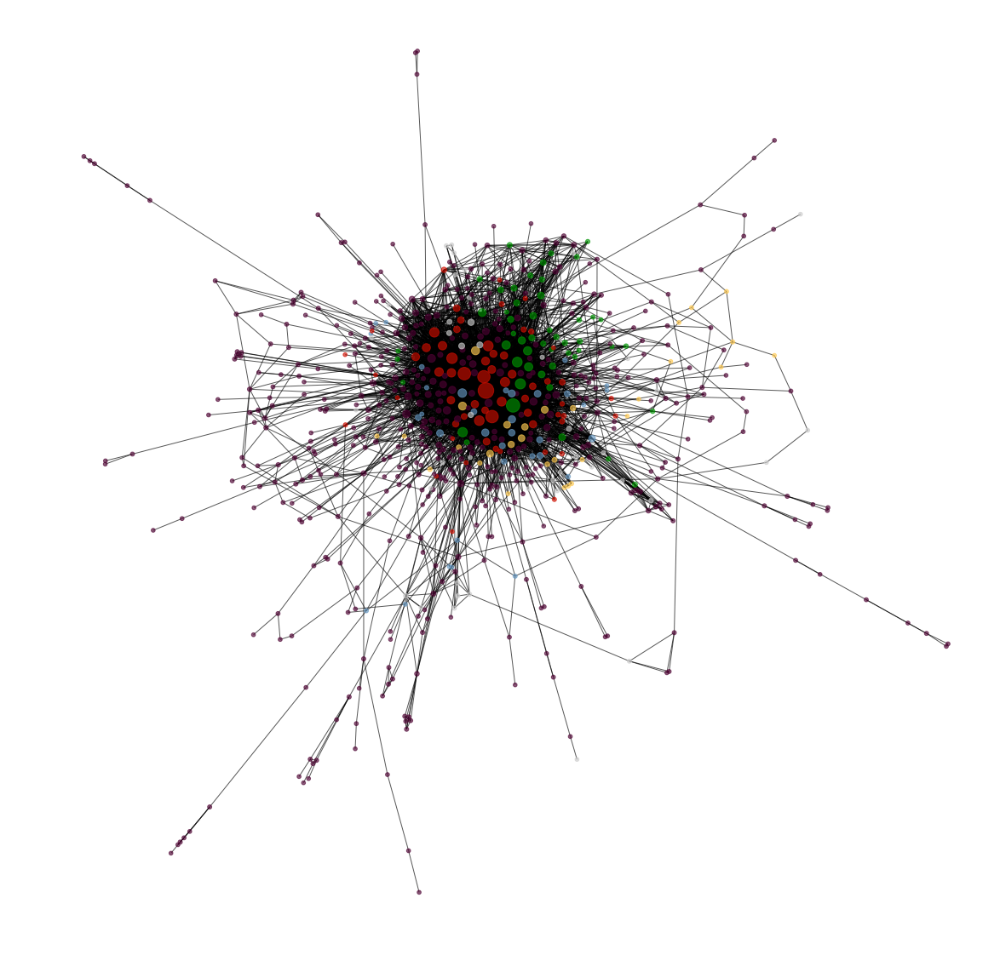

In [47]:
display_network_no_lables(
    relevant_characters,
    pos=wiki_positions, 
    size_map=[20 + relevant_characters.degree(n) for n in relevant_characters.nodes],
    color_map=[generate_node_color(n, clean_character_dict) for n in relevant_characters.nodes],
    save = save_plots,
    file_name = "wikiNet1"
)

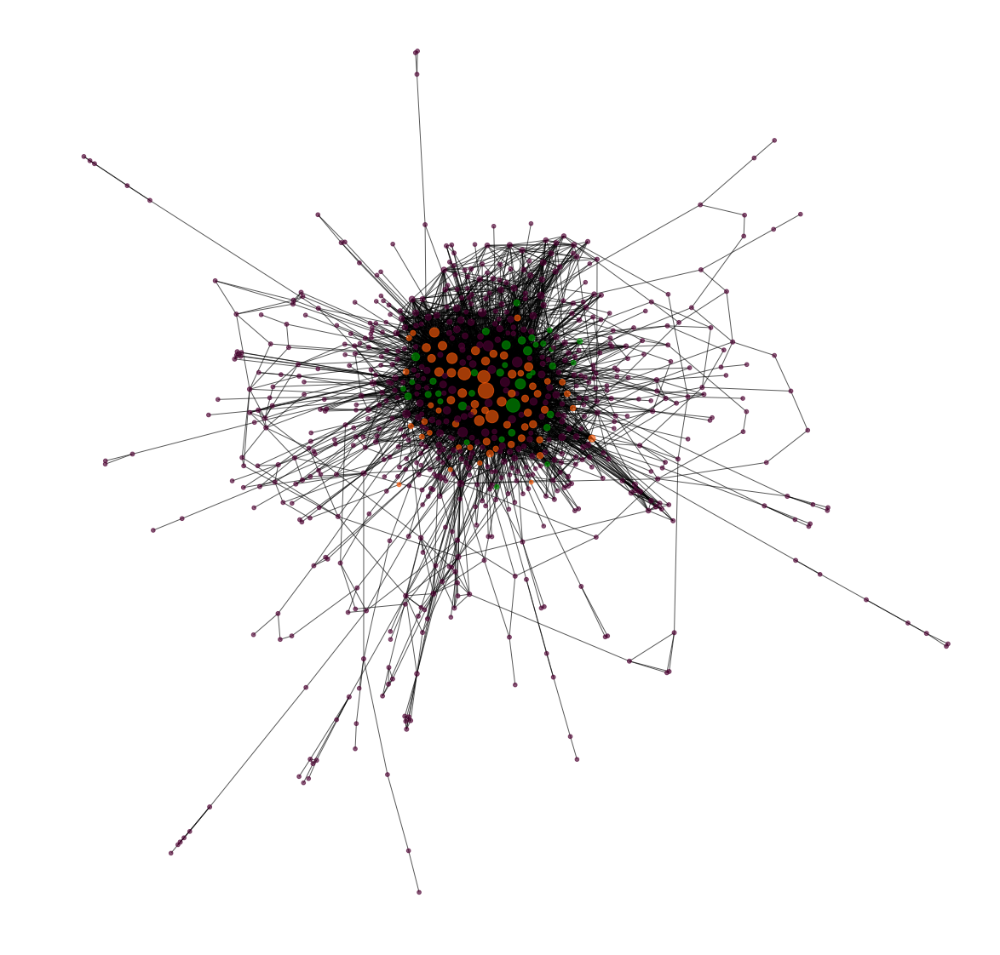

In [48]:
display_network_no_lables(
    relevant_characters,
    pos=wiki_positions, 
    size_map=[20 + relevant_characters.degree(n) for n in relevant_characters.nodes],
    color_map=[generate_node_color_good_evil(n, clean_character_dict) for n in relevant_characters.nodes],
    save = save_plots,
    file_name = "wikiNet2"
)

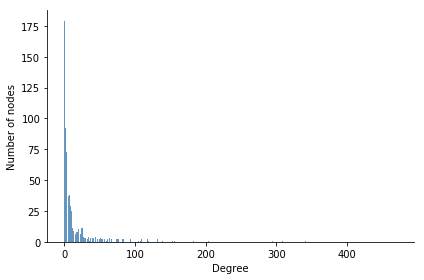

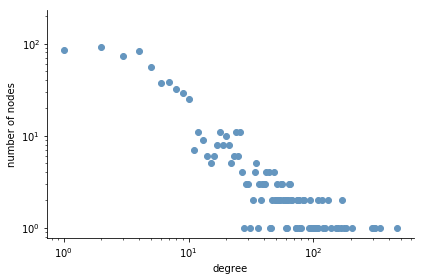

In [49]:
display_degree_destribution(DG.degree(), save=save_plots, file_name="wikiDist")

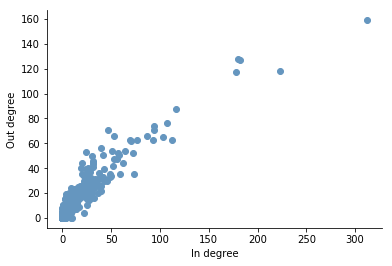

In [50]:
in_values_sorted_by_name = [int(x[1]) for x in sorted(list(DG.in_degree()))]
out_values_sorted_by_name = [int(x[1]) for x in sorted(list(DG.out_degree()))]

display_in_out_destribution(in_values_sorted_by_name, out_values_sorted_by_name, save=save_plots, file_name="inOutDist")


In [51]:
sorted(relevant_characters.degree(), key=lambda kv: kv[1], reverse=True)[:20]

[(u'harry potter', 319),
 (u'tom riddle', 230),
 (u'ronald weasley', 199),
 (u'albus dumbledore', 196),
 (u'hermione granger', 192),
 (u'ginevra weasley', 134),
 (u'severus snape', 124),
 (u'sirius black', 117),
 (u'draco malfoy', 113),
 (u'rubeus hagrid', 110),
 (u'arthur weasley', 105),
 (u'dolores umbridge', 103),
 (u'neville longbottom', 99),
 (u'minerva mcgonagall', 90),
 (u'fred weasley', 83),
 (u'luna lovegood', 82),
 (u'george weasley', 80),
 (u'molly weasley', 80),
 (u'bellatrix lestrange', 77),
 (u'lucius malfoy', 76)]

In [52]:
sorted_in_d = sorted(nx.in_degree_centrality(DG).items(), key=itemgetter(1), reverse=True)[:20]
sorted_out_d = sorted(nx.out_degree_centrality(DG).items(), key=itemgetter(1), reverse=True)[:20]
sorted_degree = sorted(nx.degree(DG), key=itemgetter(1), reverse=True)[:20]
sorted_eigen = sorted_out = sorted(nx.eigenvector_centrality(DG).items(), key=itemgetter(1), reverse=True)[:20]
sorted_between = sorted_out = sorted(nx.betweenness_centrality(DG).items(), key=itemgetter(1), reverse=True)[:20]

In [53]:
html =""
print "degree", "|", "in degree", "|", "out degree", "|", "eigenvector", "|", "betweenness"
for degree, in_d, out_d, eigen, between in zip(sorted_degree, sorted_in_d, sorted_out_d, sorted_eigen, sorted_between):
    html += "<tr>"
    print degree[0], "|", in_d[0], "|", out_d[0], "|", eigen[0], "|", between[0]
    for name, value in [degree, in_d, out_d, eigen, between]:
            if type(value) is float:
                fixed = "{:.4f}".format(value)
            else:
                fixed = str(value)
            row = "<td>" + name + "<span> " + fixed + "</span></td>"
            html += row
    html += "</tr>"

degree | in degree | out degree | eigenvector | betweenness
harry potter | harry potter | harry potter | harry potter | harry potter
tom riddle | tom riddle | ronald weasley | tom riddle | albus dumbledore
albus dumbledore | albus dumbledore | albus dumbledore | ronald weasley | tom riddle
ronald weasley | ronald weasley | tom riddle | hermione granger | gellert grindelwald
hermione granger | hermione granger | hermione granger | albus dumbledore | ronald weasley
ginevra weasley | ginevra weasley | ginevra weasley | severus snape | hermione granger
severus snape | sirius black | severus snape | draco malfoy | ginevra weasley
sirius black | severus snape | rubeus hagrid | sirius black | rita skeeter
draco malfoy | draco malfoy | dolores umbridge | ginevra weasley | seraphina picquery
rubeus hagrid | dolores umbridge | george weasley | neville longbottom | arthur weasley
dolores umbridge | rubeus hagrid | fred weasley | dolores umbridge | lucius malfoy
arthur weasley | arthur weasley | n

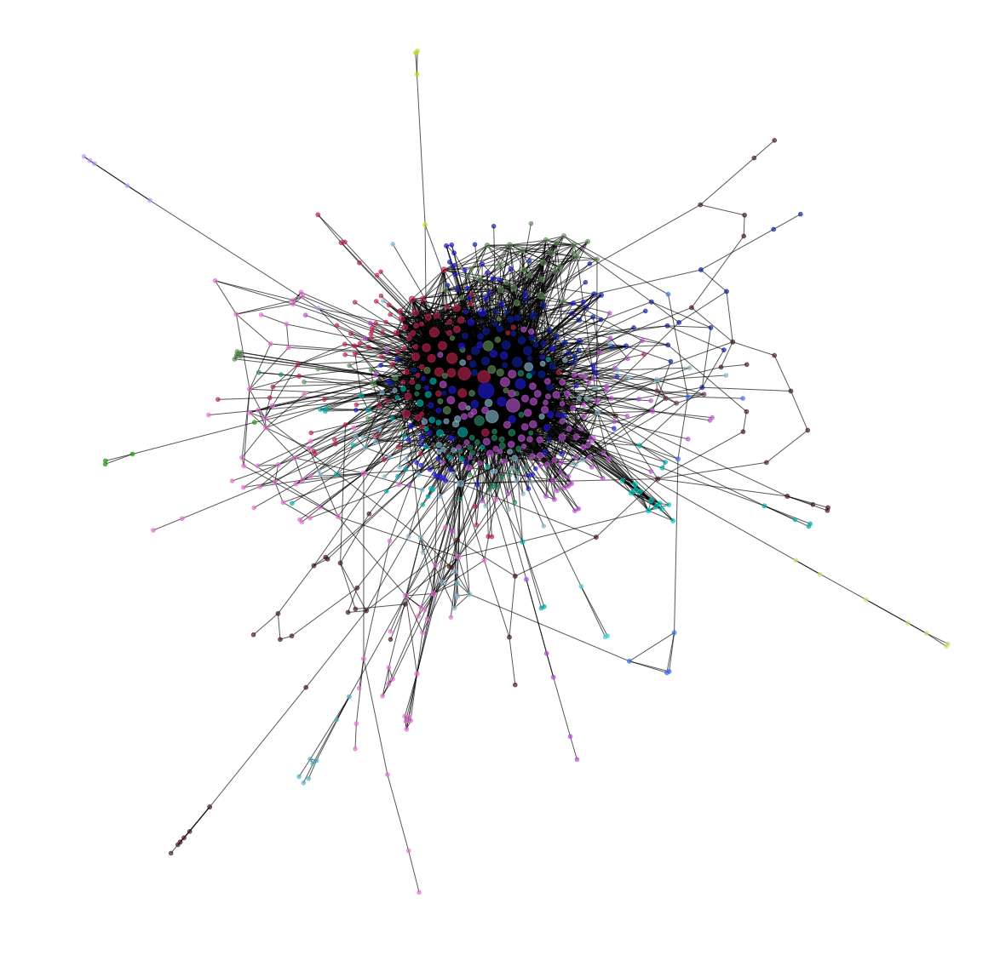

In [54]:
partitions = community.best_partition(relevant_characters,weight='weight')
unique_partitions = set(partitions.values())
partition_colors = dict(zip(unique_partitions, genrate_color_series(len(unique_partitions))))
color_map = [partition_colors[partitions[n]] for n in relevant_characters.nodes]

display_network_no_lables(
    relevant_characters,
    pos=wiki_positions, 
    size_map=[20 + relevant_characters.degree(n) for n in relevant_characters.nodes],
    color_map=color_map,
    save = save_plots,
    file_name = "wikiNetCom"
)

In [55]:
html =""
for index, community_color in enumerate(genrate_color_series(len(unique_partitions))):
    html += "<div><span class='node-label' style='background:" + community_color + "'></span>Community" + str(index) +"</div>"

In [56]:
grouped_by_community = defaultdict(list)

for character, community_id in partitions.iteritems():
    grouped_by_community[community_id].append((character,relevant_characters.degree(character)))

In [57]:
community_lists = []
for community_id, characters in grouped_by_community.items():
    print"------- community:", community_id, "-------"
    html = "<ul>"
    for character, degree in sorted(characters, key=itemgetter(1), reverse=True):
        print character, degree
        html += "<li>"+character.encode("utf-8")+"</li>"
    html+= "</ul>"
    community_lists.append(html)

------- community: 0 -------
tom riddle 230
neville longbottom 99
cedric diggory 67
dean thomas 66
angelina johnson 59
seamus finnigan 52
katie bell 52
poppy pomfrey 50
cho chang 49
pomona sprout 47
parvati patil 45
nagini 44
salazar slytherin 44
colin creevey 44
susan bones 44
hannah abbott 44
terry boot 43
sorting hat 43
sybill trelawney 42
justin finch-fletchley 42
alicia spinnet 41
lavender brown 40
ernest macmillan 39
zacharias smith 36
anthony goldstein 34
michael corner 33
padma patil 29
oliver wood 28
marietta edgecombe 27
romilda vane 26
merope riddle 25
cormac mclaggen 25
firenze 23
leanne 21
dennis creevey 20
helena ravenclaw 20
tom 19
frank bryce 19
morfin gaunt 18
alice longbottom 18
frank longbottom 18
tom riddle senior 17
rowena ravenclaw 17
amos diggory 17
godric gryffindor 16
charity burbage 16
marvolo gaunt 15
amelia bones 14
helga hufflepuff 14
selwyn 13
trevor 12
hepzibah smith 11
cole 10
caractacus burke 10
bob ogden 10
borgin 9
demelza robins 9
galatea merrythough

glynnis griffiths 2
gwenog 2
timothy blenkinsop 2
felix summerbee 1
rudolf brand 1
hector bolobolo 1
herman junker 1
raul almeida 1
barnabus blenkinsop 1
franziska faust 1
abernathy 1
dougal 1
mullet 1
matilda dukelow 1
------- community: 6 -------
robert hilliard 9
lily moon 7
leonard spencer-moon 7
gabriel truman 5
dennis moon 5
uric the oddball 5
goodwin kneen 5
glenda chittock 4
radulf 4
lorcan mclaird 4
loxias 4
arcus 3
phyllida spore 3
barnabas deverill 3
priscilla dupont 3
egbert the egregious 3
archer evermonde 3
hector fawley 3
hengist of woodcroft 3
gunhilda kneen 3
ignatia wildsmith 3
bridget wenlock 3
livius 3
hengist of upper barnton 2
olaf 2
hereward 2
bogomil levski 2
wilhelmina tuft 2
devlin whitehorn 2
charlie baverstock 2
lord palmerston 2
alberta toothill 2
ugga 2
emeric the evil 2
ignatius tuft 2
radolphus pittiman 2
winston churchill 2
godelot 2
gifford ollerton 2
lorcan d'eath 2
dugald mcphail 2
venusia crickerly 1
perpetua fancourt 1
derwent shimpling 1
oona 1
br

In [58]:
html =""
for index, community_html in enumerate(community_lists):
    html +="<p>Community " + str(index) +"</p>" + community_html

In [59]:
#html

# Generate and Analyze Movie Networks

In [60]:
files = [
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt",
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt",
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt",
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt",
    "HP5.txt",
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt",
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt",
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt" 
]

In [61]:
with open('nameDict.json') as json_file:  
    name_dict = json.load(json_file, encoding="utf-8")

In [62]:
with open('characterInfoDict.json') as json_file:  
    info_dict = json.load(json_file, encoding="utf-8")

In [63]:
ignore_in_movie={
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt": {"bertie", "jack", "po", "nicholas"},
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt": {"fluffy", "tufty", "gryffindor"},
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt": {"miranda", "ernie", "horace"},
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt": {"monsieur"},
    "(5)_Harry_Potter_and_the_Order_of_the_Phoenix.txt": {"gideon"},
    "HP5.txt":{"oswald", "bob"},
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt": {"WOOD", "felix"},
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt": {"percival", "elizabeth", "WOOD"},
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt": {"WOOD", "fang"}
}

In [64]:
special_cases = {
    "WOOD":"oliver wood", 
    "OLIVER WOOD": u"oliver wood", 
    "oliver wood": u"oliver wood",
    "Oliver wood": u"oliver wood",
    "mrs. weasley": u"molly weasley", 
    "mr. weasley": u"arthur weasley",
    "arthur weasley's daughter": u"ginny weasley",
    "ERNIE PRANG": u"ernie prang",
    "wailing widow": u"wailing widow",
    "Miss Brown": u"lavender brown",
    "MRS BLACK": u"walburga black",
    "BARTY JR": u"barty crouch jr.",
    "BARTY SR": u"barty crouch",
    "Frank Longbottom": u"frank longbottom",
    "HUGO": u"hugo granger-weasley",
    "ALBUS_SON": u"albus severus potter",
    "LILY_DAUGTER": u"lily l. potter",
    "ROSE_DAUGHTER": u"rose granger-weasley",
    "JAMES_SON": u"james potter ii",
    "ADRIAN": u"adrian (photographer)",
    "SIR_NICHOLAS": u"sir nicholas",
    "Gideon": u"gideon prewett",
    "LUCIOUS MALFOY": u"lucius malfoy",
    "Bob_muggle":"bob"
}

In [65]:
movies = []

# go through all scripts and process them
for script_name in files:
    with open("../movieScripts/" + script_name) as f:
        script = f.read()
        ignore = []
        if ignore_in_movie.has_key(script_name):
            ignore = ignore_in_movie[script_name]
        
        data = process_script(
            script=script, 
            tokenizer=word_tokenizer, 
            name_mappings=name_dict, 
            special_cases=special_cases, 
            ignore=ignore
        )
        movies.append(data)

In [66]:
with open("shortNames.json", "r") as json_dict:
    shortNames = json.load(json_dict)

100%|██████████| 10000/10000 [00:02<00:00, 3508.77it/s]


('BarnesHut Approximation', ' took ', '0.53', ' seconds')
('Repulsion forces', ' took ', '1.92', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.05', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.13', ' seconds')


100%|██████████| 10000/10000 [00:03<00:00, 2658.16it/s]


('BarnesHut Approximation', ' took ', '0.67', ' seconds')
('Repulsion forces', ' took ', '2.60', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.06', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.18', ' seconds')


100%|██████████| 10000/10000 [00:03<00:00, 3222.69it/s]


('BarnesHut Approximation', ' took ', '0.58', ' seconds')
('Repulsion forces', ' took ', '2.12', ' seconds')
('Gravitational forces', ' took ', '0.04', ' seconds')
('Attraction forces', ' took ', '0.05', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.14', ' seconds')


100%|██████████| 10000/10000 [00:02<00:00, 4572.47it/s]


('BarnesHut Approximation', ' took ', '0.45', ' seconds')
('Repulsion forces', ' took ', '1.39', ' seconds')
('Gravitational forces', ' took ', '0.02', ' seconds')
('Attraction forces', ' took ', '0.05', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.11', ' seconds')


100%|██████████| 10000/10000 [00:03<00:00, 3125.00it/s]


('BarnesHut Approximation', ' took ', '0.58', ' seconds')
('Repulsion forces', ' took ', '2.22', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.04', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.15', ' seconds')


100%|██████████| 10000/10000 [00:03<00:00, 2557.54it/s]


('BarnesHut Approximation', ' took ', '0.73', ' seconds')
('Repulsion forces', ' took ', '2.70', ' seconds')
('Gravitational forces', ' took ', '0.04', ' seconds')
('Attraction forces', ' took ', '0.06', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.15', ' seconds')


100%|██████████| 10000/10000 [00:06<00:00, 1599.74it/s]


('BarnesHut Approximation', ' took ', '1.06', ' seconds')
('Repulsion forces', ' took ', '4.41', ' seconds')
('Gravitational forces', ' took ', '0.08', ' seconds')
('Attraction forces', ' took ', '0.10', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.25', ' seconds')


100%|██████████| 10000/10000 [00:04<00:00, 2161.69it/s]


('BarnesHut Approximation', ' took ', '0.81', ' seconds')
('Repulsion forces', ' took ', '3.17', ' seconds')
('Gravitational forces', ' took ', '0.06', ' seconds')
('Attraction forces', ' took ', '0.10', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.18', ' seconds')


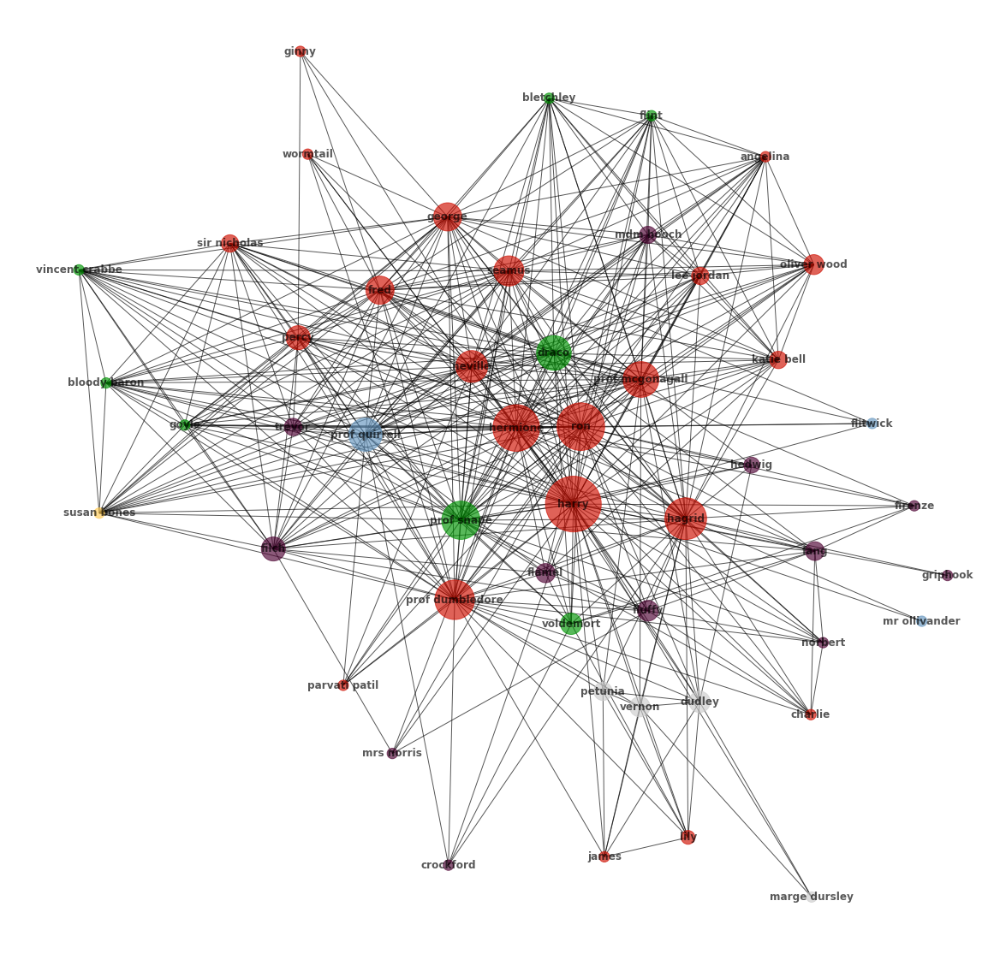

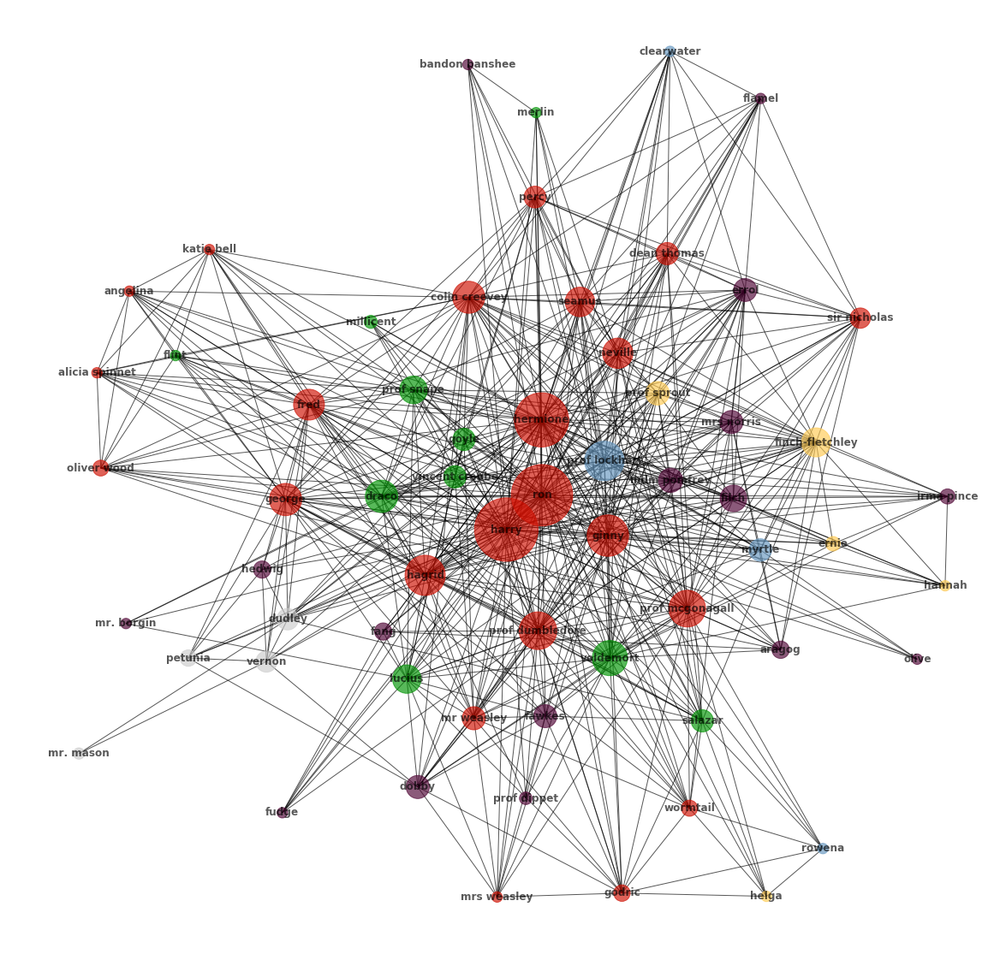

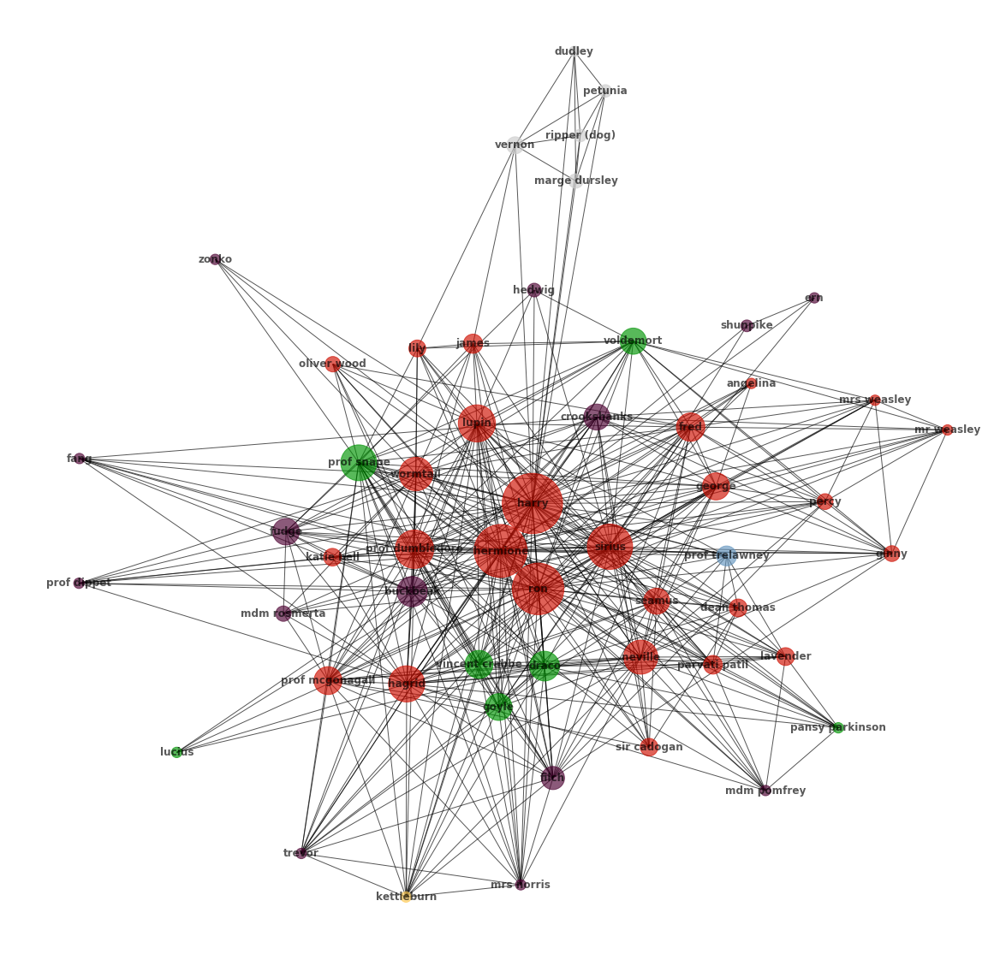

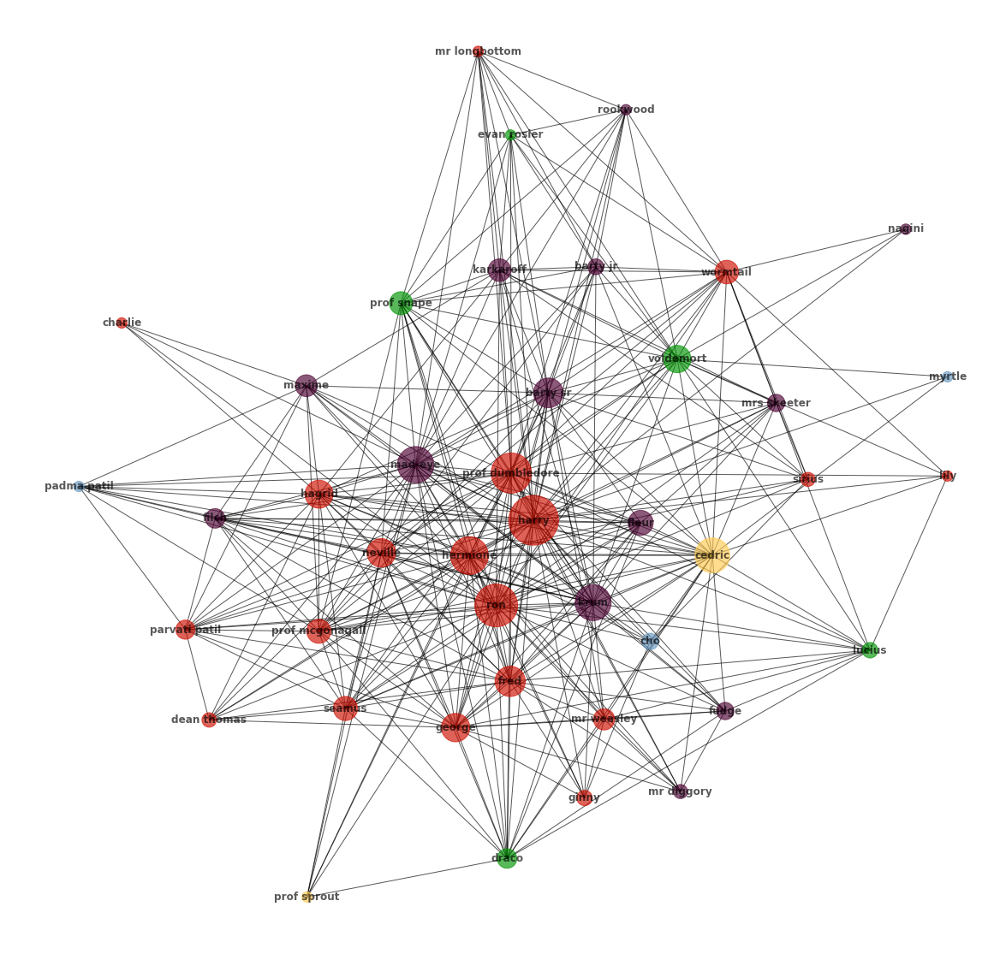

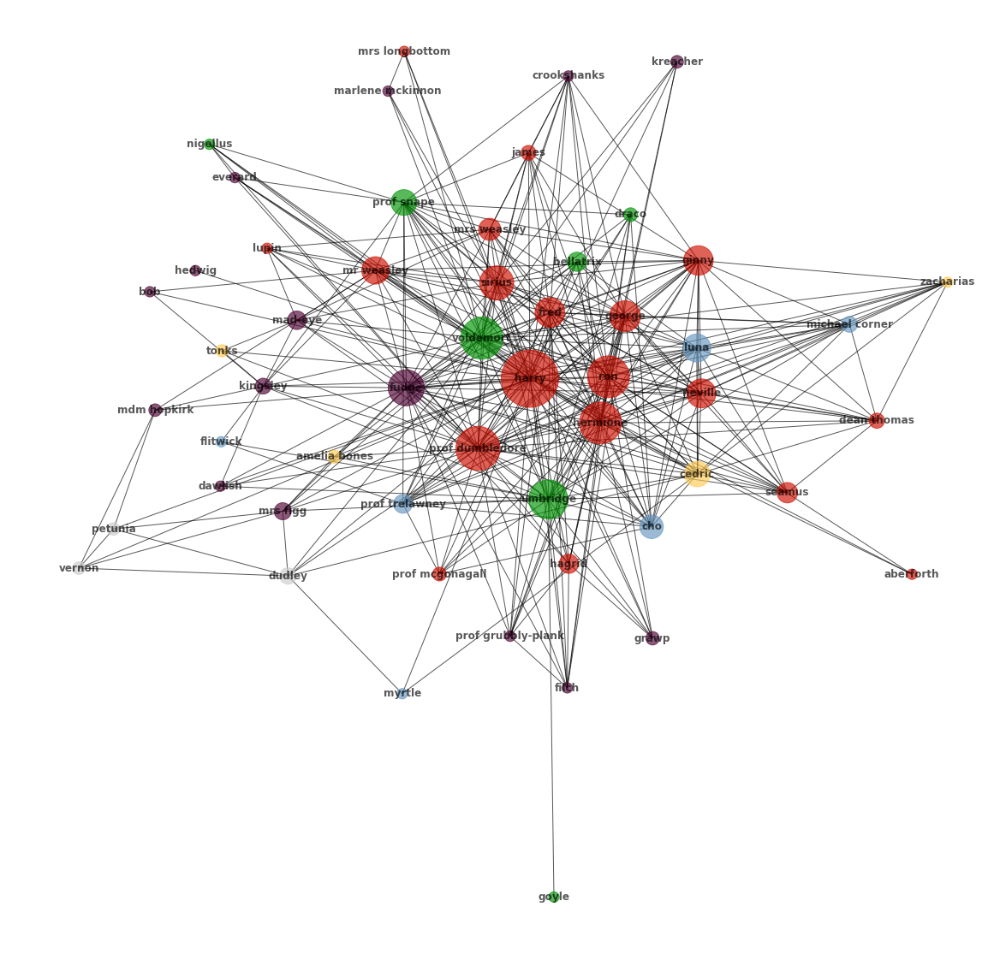

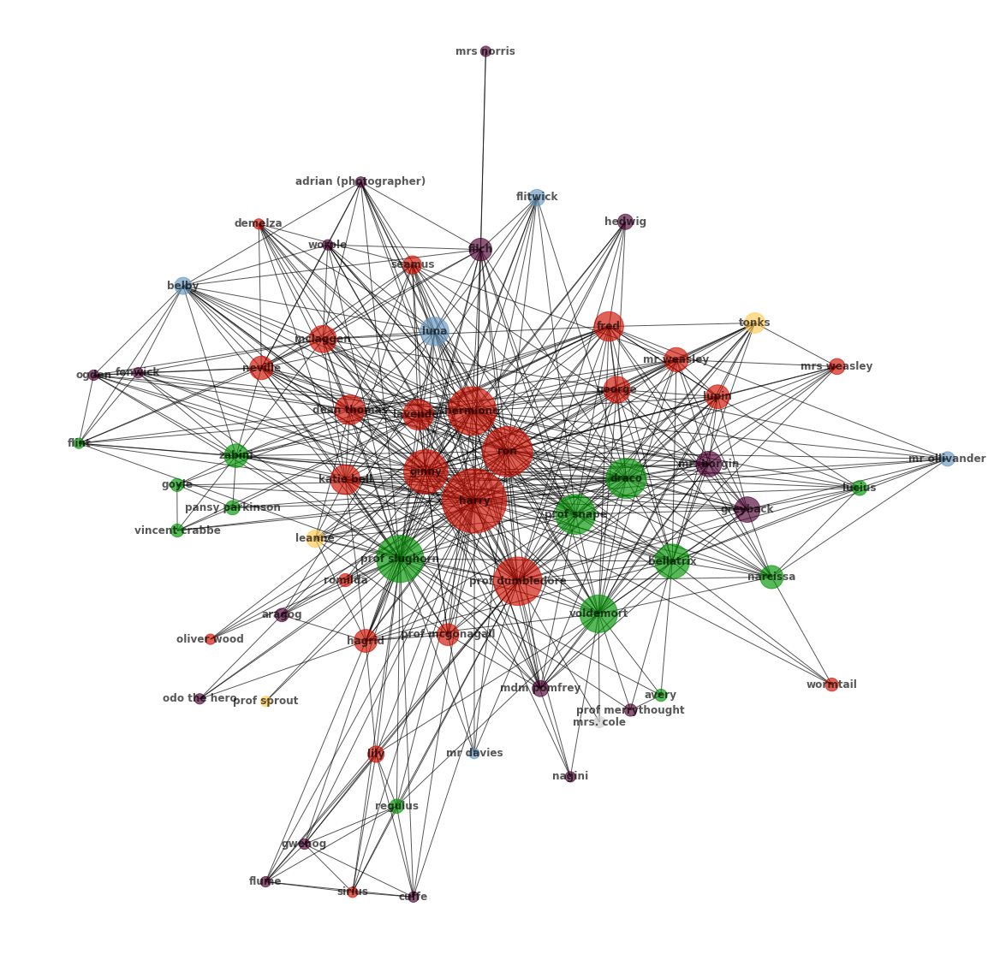

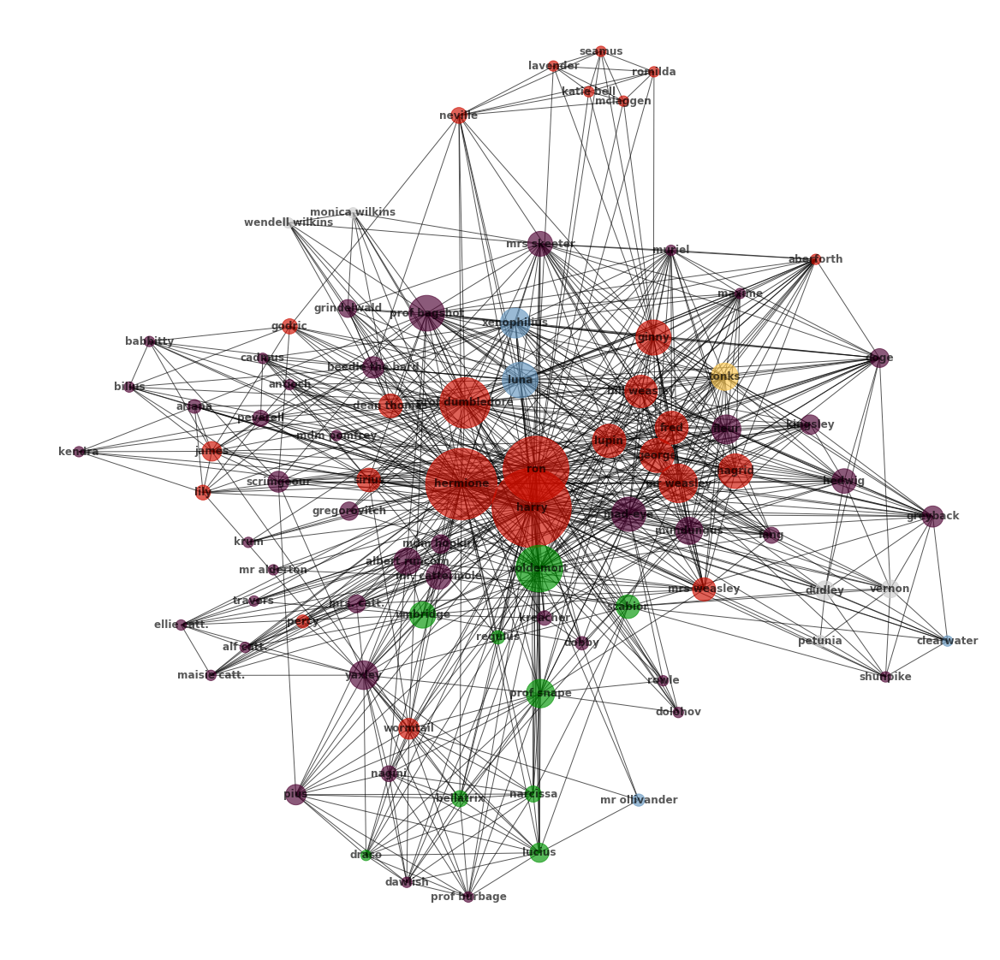

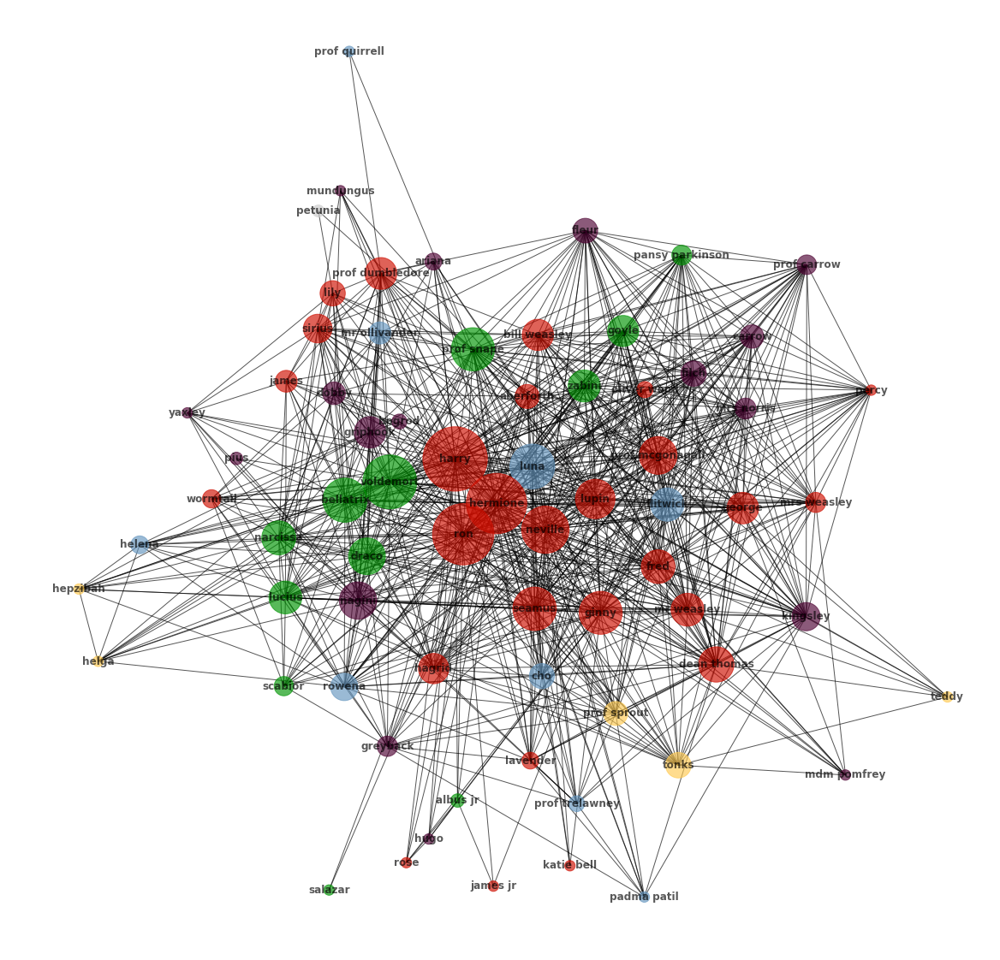

In [67]:
networks = []
positions = []

forceatlas2 = FA2(scalingRatio=100, gravity=100)

for index , movie in enumerate(movies):
    G = generate_movie_network(movie.occurrences) 
    position = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=10000)
    short_labels = {n:shortNames[n] for n in G.nodes}
    node_size = [150 + int(20 * G.degree(n) * log(total_occurences(movie.occurrences, n))) for n in G.nodes]
    color_map = [generate_node_color(n, info_dict) for n in G.nodes]
    display_network(G, position, node_size, color_map, save=save_plots, file_name="movie"+str(index+1), node_lables=short_labels)
    networks.append(G)
    positions.append(position)

Disadvantages of adding a note to each character taht is mentioned in a scene: the chatacter might only appear in one scene but could get an infalted degree if many other characters are mentioend in the scnene.

<Figure size 432x288 with 0 Axes>

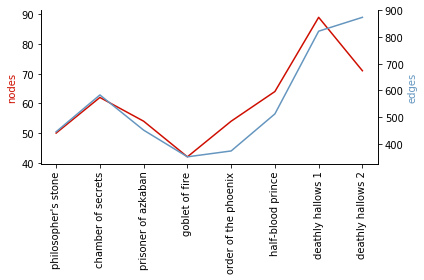

In [68]:
nodes = []
edges = []

for index, network in enumerate(networks):
    nodes.append(len(network.nodes))
    edges.append(len(network.edges))
    
labels = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"
]

plot_networks_over_time(nodes, edges, labels, save=save_plots, file_name="degreeSeries")

In [69]:
with open("../characters.json") as f:
    characters = json.load(f) 

In [70]:
degrees_by_movie = defaultdict(list)

for index, network in enumerate(networks):
    top_degrees = sorted(nx.degree(network), key=itemgetter(1), reverse=True)[:20]
    for node, degree in top_degrees:
        degrees_by_movie[node].append((index, degree))

In [71]:
labels = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"
]

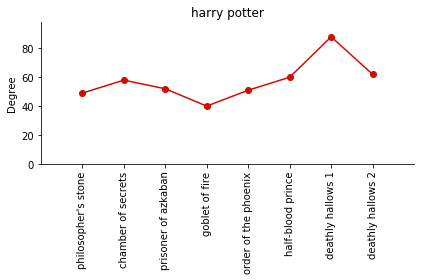

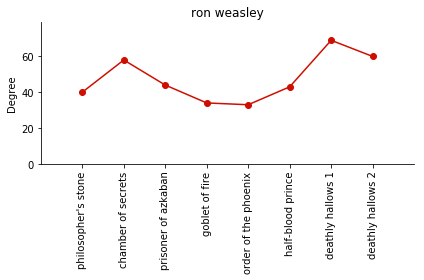

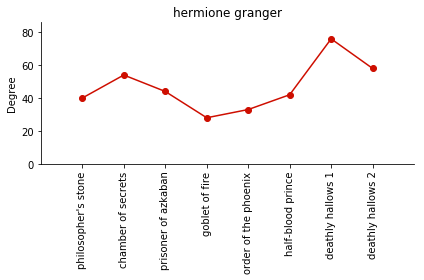

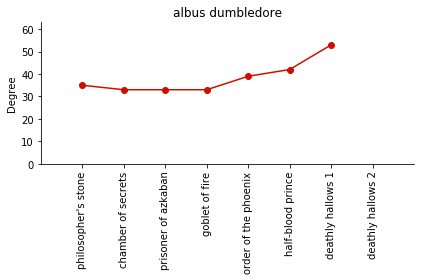

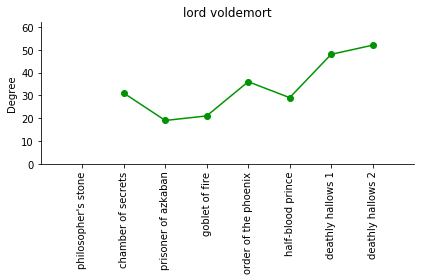

...

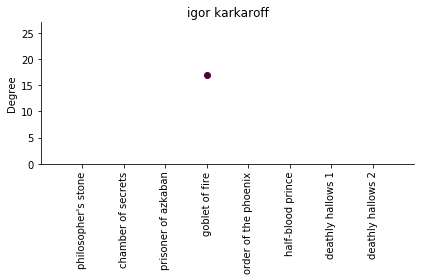

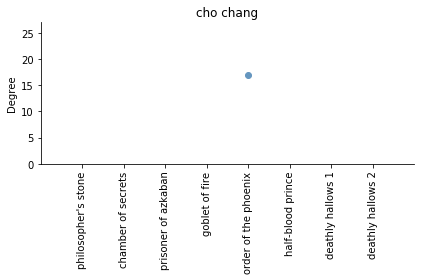

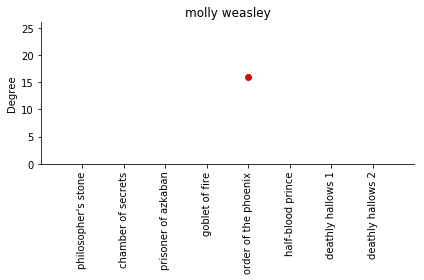

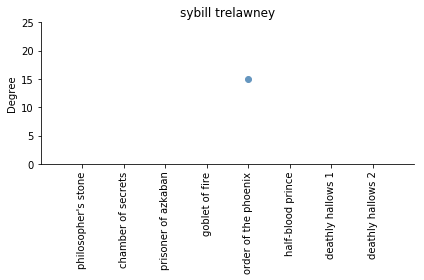

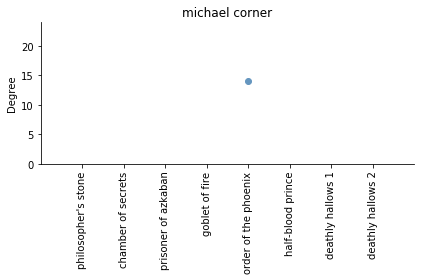

In [72]:
sorted_by_most_total_degrees = sorted(degrees_by_movie.iteritems(), key=lambda kv: sum(zip(*kv[1])[1]), reverse=True)
for index, (node, degrees) in enumerate(sorted_by_most_total_degrees):
    x,y = zip(*degrees)
    color = generate_node_color(node, info_dict)
    name = "degree" + str(index+1)
    display_degree_series(x, y, node, color, labels, save=save_plots, file_name=name)

In [73]:
#put all characters that acutally are in the networks  into a dictionary
#where the names can be shortend manually
json_dict_name = "shortNames.json"

with open(json_dict_name, "r") as json_dict:
    shortNames = json.load(json_dict)
    for network in networks:
        for node in network.nodes:
            if not shortNames.has_key(node):
                print "adding:", node
                shortNames[node] = node

with open(json_dict_name, "w") as json_dict:
    json.dump(shortNames, json_dict)

In [74]:
missing_infos = []
for movie in movies:
    for scene, characters in movie.occurrences.iteritems():
        for character in characters:
            if not info_dict.has_key(character):
                print character
                #missing_infos.append(character)            

In [75]:
missing_info_dict = {}
for character in set(missing_infos):
    missing_info_dict[character] = {"house":"", "blood":"", "loyaty":[]}

In [76]:
"""with open("missingInfoDict.json", "w") as json_file:
    json.dump(missing_info_dict, json_file)"""

'with open("missingInfoDict.json", "w") as json_file:\n    json.dump(missing_info_dict, json_file)'

adding: amelia susan bones
adding: bob ogden
adding: oswald beamish
adding: wilhelmina grubbly-plank

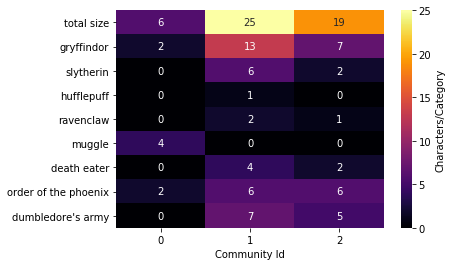

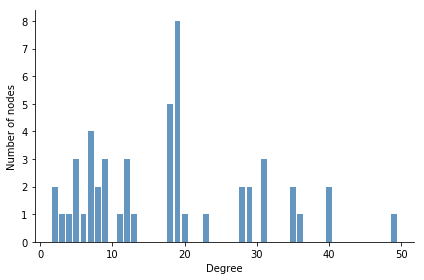

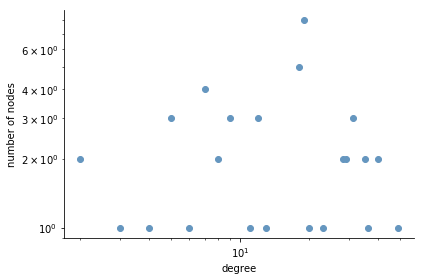

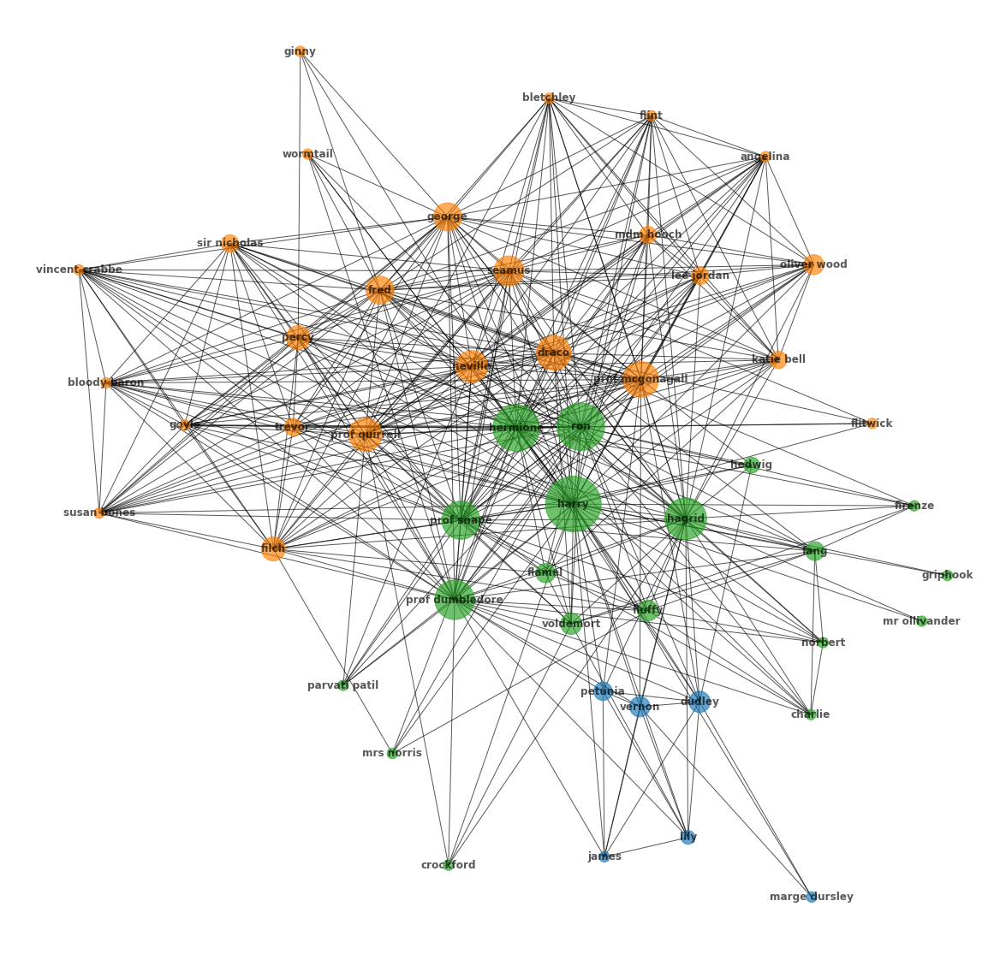

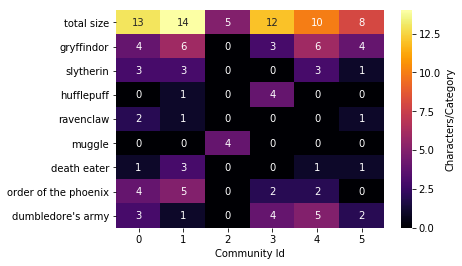

...

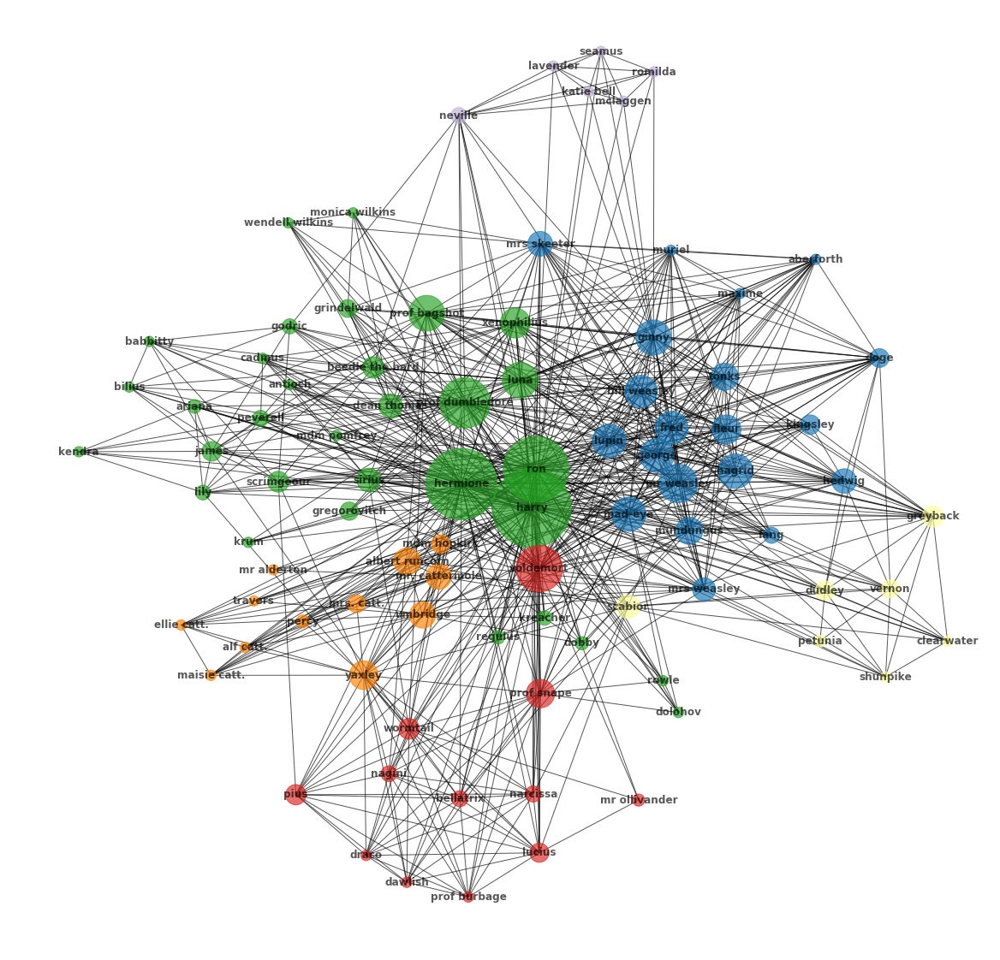

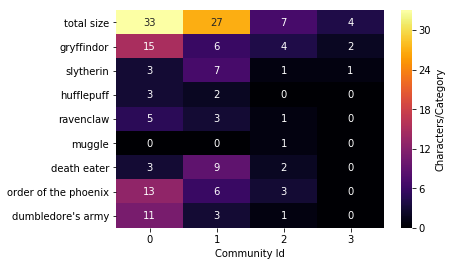

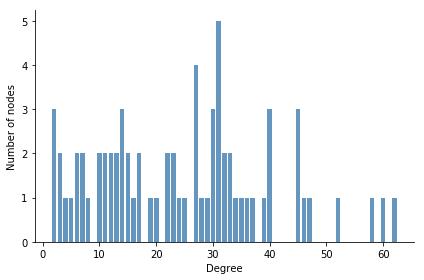

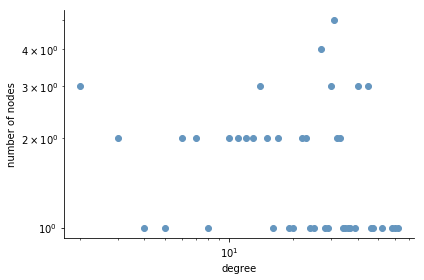

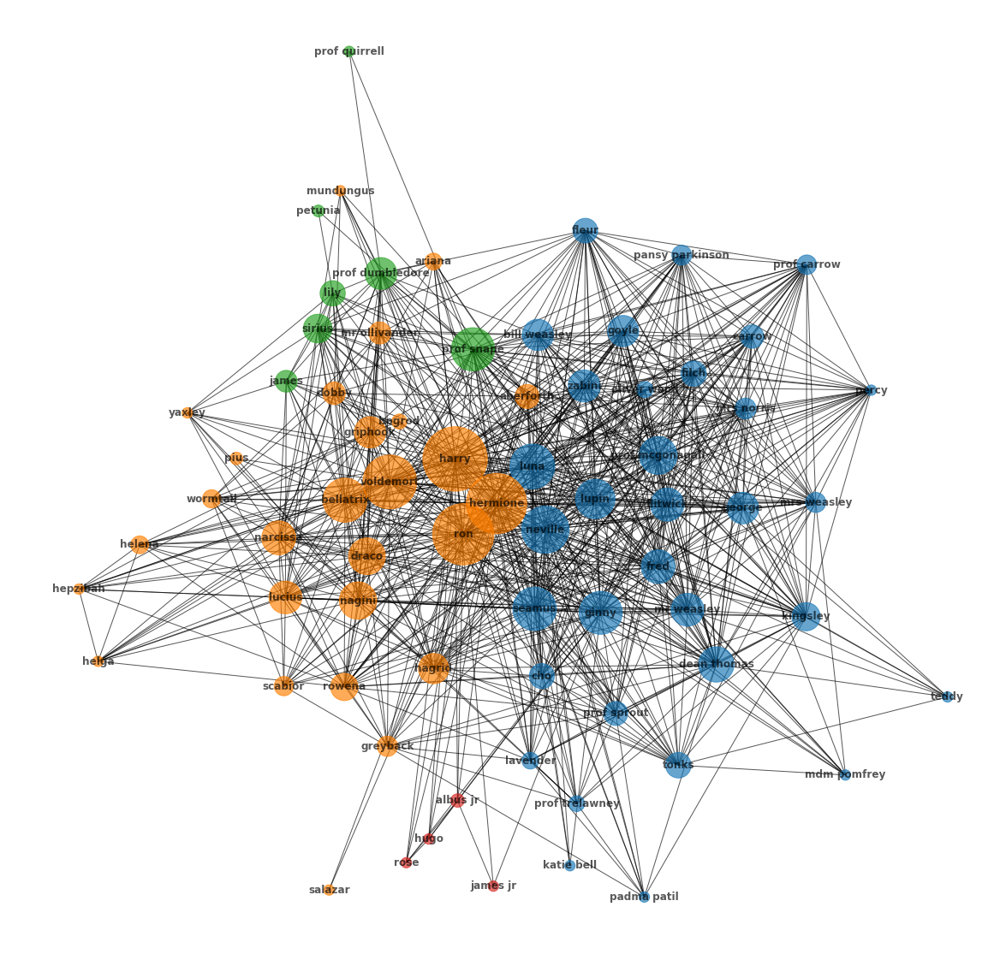

In [77]:
for index, (G, position, movie) in enumerate(zip(networks, positions, movies)):
    file_suffix = "Movie"+ str(index+1)
    partitions = community.best_partition(G,weight='weight')
    unique_partitions = set(partitions.values())
    
    partition_colors = generate_colors(unique_partitions)
    short_labels = {n:shortNames[n] for n in G.nodes}
    node_size = [150 + int(20 * G.degree(n) * log(total_occurences(movie.occurrences, n))) for n in G.nodes]
    color_map = [partition_colors[partitions[n]] for n in G.nodes]
    
    matrix = analyze_communities(partitions, info_dict)
    
    heatmap_name = "heatmap" + file_suffix
    display_community_heatmap(matrix, color_map="inferno", save=save_plots, file_name=heatmap_name)
    
    distribution_name = "distr" + file_suffix 
    display_degree_destribution(G.degree(), save=save_plots, file_name=distribution_name)
    
    network_name = "communities" + file_suffix
    display_network(
        G, 
        position, 
        node_size, 
        color_map, 
        save=save_plots, 
        file_name=network_name, 
        node_lables=short_labels)
    
   

# 3.2 TF-IDF and Sentiments Analysis

## 3.2 Data Cleaning and Preparation

In [78]:
#open a text file of all the books in the book series
raw = io.open('../books/HP_all.txt', "r", encoding="utf-8").read()
#Extract any additional information on the books from the beginning and end of the file.
#books = raw[944:6317630]

In [79]:
#Isolate each book individually, from the first chapter to the last fullstop.
book1 = raw[944:441162]
book2 = raw[442547:936710]
book3 = raw[938248:1567329]
book4 = raw[1569412:2678784]
book5 = raw[2680953:4180604]
book6 = raw[4182370:5170313]
book7 = raw[5173433:6317630]

In [80]:
#Collect all the books into an arrey to more simply navigate and extract information.
book = []
book.append(book1)
book.append(book2)
book.append(book3)
book.append(book4)
book.append(book5)
book.append(book6)
book.append(book7)
print(len(book))

7


In [81]:
#Create a list of lists with the individual chapters, split at the unique word CHAPTERS.
chp = []
for bok in book:
    chp.append(bok.split("CHAPTER")[1:])
print(len(chp))

7


In [82]:
#the stopwords for later use  in the wordcloud
stop_words = set(stopwords.words('english'))
#including "said" as it is appeard repeatedly on th wordclouds.
stop_words.add(u'said')
#print(stop_words)
#print(type(stopwords.words('english')))

In [83]:
#Function to extract only the dialog from a text, while also making sure to accound for utf-8
def dialog(book):
    book = book.encode("utf-8")
    book = book.replace('\xe2\x80\x99','\'')
    book = book.replace('\xe2\x80\x94','-')
    book = book.replace('\xe2\x80\x98','\'')
    book = book.replace("\n\n\xe2\x80\x9c", ' ')
    dialogen = re.findall(r'\“([\s\S]*?)\”', book)
    return dialogen

In [84]:
#Cleanign text, with respect to utf-8
def tolist(book):
    book = book.encode("utf-8")
    book = book.replace('\xe2\x80\x99','\'')
    book = book.replace('\xe2\x80\x94','-')
    book = book.replace('\xe2\x80\x98','\'')
    book = book.replace("\n\n\xe2\x80\x9c", ' ')
    book = book.replace("\u2019","\'")
    book = book.replace('\n',' ')
    out = book
    return out

In [85]:
#Extracting the average happyness index to be used for sentiment analysis
from collections import defaultdict
ds = pd.read_csv('../Data_Set_S1.txt', skiprows=3, sep=" ", delimiter="\t")
ds.word[ds.word == 'after'].index[0]

avg_word_happiness = defaultdict(float)
for index, data in ds.iterrows():
    word =  data["word"]
    score = data["happiness_average"]
    avg_word_happiness[word] = score

In [86]:
#function to calculate sentiment on a list of tokens
def sentiment(toke):
    tokens = [x.lower() for x in toke]
    unique_tokens = list(set(tokens))
    sum = 0
    remove = 0
    for token in unique_tokens:
        if avg_word_happiness.has_key(token):
            h = avg_word_happiness[token]
            f = tokens.count(token)
            sum += (h*f)
        else:
            remove += tokens.count(token)
    if (len(tokens)-remove) == 0:
        sent = 0
    else:
        sent= sum/(len(tokens)-remove)
    return sent

In [87]:
#creating a list of lists of the the dialogs on each book.
dilog = []
for bok in book:
    dilog.append(dialog(bok))
print(len(dilog))

7


In [88]:
#tokenizes an list input
def tokenize_list(text):
    tokenizer = RegexpTokenizer(r'\w+')
    dialog = []
    for i in range(len(text)):
        line = tokenizer.tokenize(text[i])
        dialog.append(line)
    return dialog

#tokenizes a string input
def tokenize_str(text):
    tokenizer = RegexpTokenizer(r'\w+')
    line = tokenizer.tokenize(text)
    return line

In [89]:
#function to evaluate the sentiment analysis of the dialog
def sentiment_dilog(dialog):
    g = tokenize_list(dialog)
    sent = []
    for i in range(len(g)):
        sen = sentiment(g[i])
        sent.append(sen)
    return sent

In [90]:
#Find the sentimen for each of the books based on dialog. i belive this is the most efficient as dialog better reflects
#a mood than the desciptive parts of a book.
sendilog = []
for boook in dilog:
    sendilog.append(sentiment_dilog(boook))
for senti in sendilog:
    print(np.mean(senti))

5.308377204471506
5.295769655712531
5.286883953145128
5.267052585703176
5.272197023995928
5.2909159492604605
5.20978714308175


In [91]:
#dilog[0]

In [92]:
#Sentimant analysis of each book
senbook = []
for each in book:
    senbook.append(sentiment(tokenize_str(each)))
    print(sentiment(tokenize_str(each)))

5.33385911817
5.32007207254
5.31981087567
5.33023696409
5.32624551042
5.3280163771
5.29587962731


In [93]:
#function to extract stopwords from a string
def stopwords(book):
    unique = set(book)
    bo = book
    for word in unique:
        if word in stop_words:
            bo.remove(word)
    return bo

In [94]:
#remove stopwwords and tokenize the books
nostop = []
for each in book:
    nostop.append(stopwords(tokenize_str(each)))

## 3.2 TF-IDF Word Clouds

In [95]:
#function to calculate the TF-IDF, tanken from prior assignment in the course
def TF_IDF(documents):
    result = []
    cross_document_freq = defaultdict(int)
    #count in how many documents the token occurs
    for document in documents:
        for token in set(document):
            cross_document_freq[token] += 1 
    
    for document in documents:
        TF = FreqDist(document)
        # calculate the TF/IDF for each token
        TF_IDF = defaultdict(float) 
        for token in TF.keys():
            TF_IDF[token] = TF[token] * log(len(documents)/cross_document_freq[token])
            
        result.append(sorted(TF_IDF.iteritems(), key=lambda (k,v): (v,k), reverse=True))
    return result

In [96]:
#For the world could illustration, taken form earlier exercise in the course
def generate_cloud_string(freq_list):
    result = ""
    for token, frequency in freq_list:
        result += (token + " ") * int(ceil(frequency))
    return result  

In [97]:
#Function to display the wordcloud, taken from earlier assignment in the course.
def display_cloud(string, background="black",mask=None, collocations=False, stop_words={}, title="wc" ):
    mask = np.array(Image.open("sortingHat.jpg"))
    plt.figure()
    cloud = WordCloud(
        background_color="black",
        width=1800,
        height=1400,
        mask = mask,
        stopwords=stop_words,
        collocations=collocations,
        #background_color="rgba(255, 255, 255, 0)", 
        mode="RGBA"
    ).generate(string)
    cloud.recolor(color_func=lambda *args, **kwargs: "white", random_state=3)
    plt.figure(figsize=(20,20))
    plt.imshow(cloud)
    plt.axis('off')

    plt.tight_layout()
    #plt.savefig("../plots/clouds/" + title + ".png", dpi=300, transparent=True, bbox_inches = "tight")
    plt.show()

In [98]:
WC = TF_IDF([nostop[0],nostop[1],nostop[2],nostop[3],nostop[4],nostop[5],nostop[6]])

In [99]:
CL = []
for i in WC:
    CL.append(generate_cloud_string(i))

<Figure size 432x288 with 0 Axes>

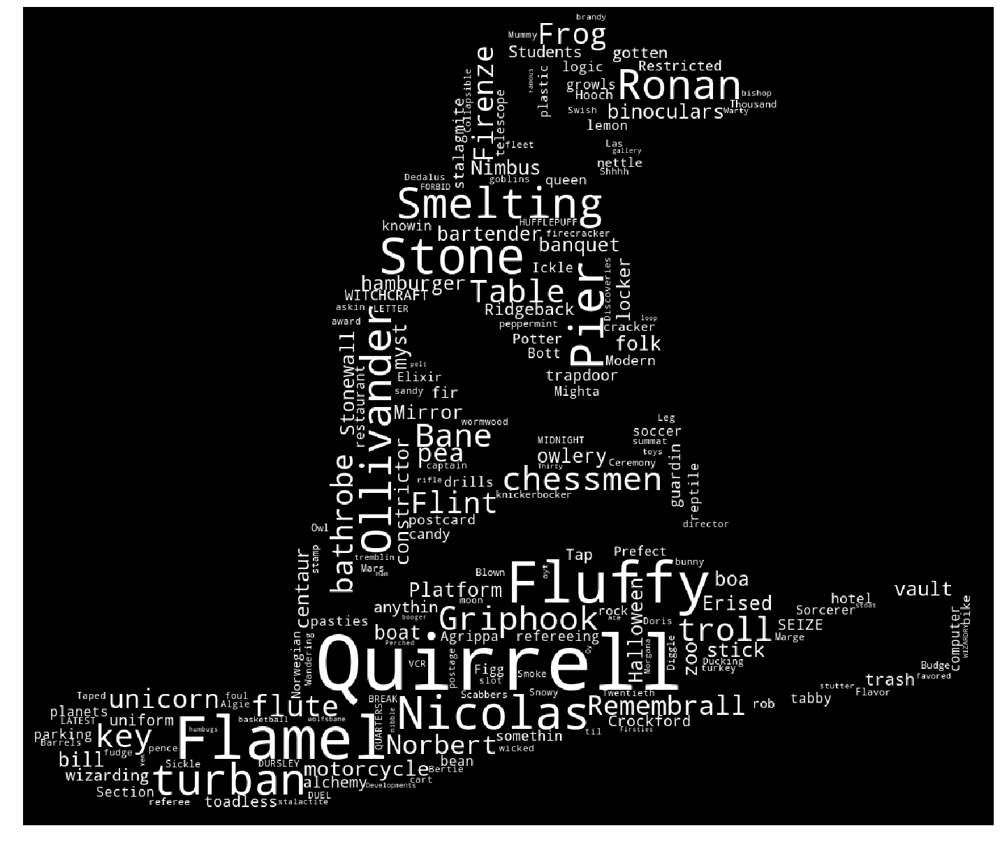

<Figure size 432x288 with 0 Axes>

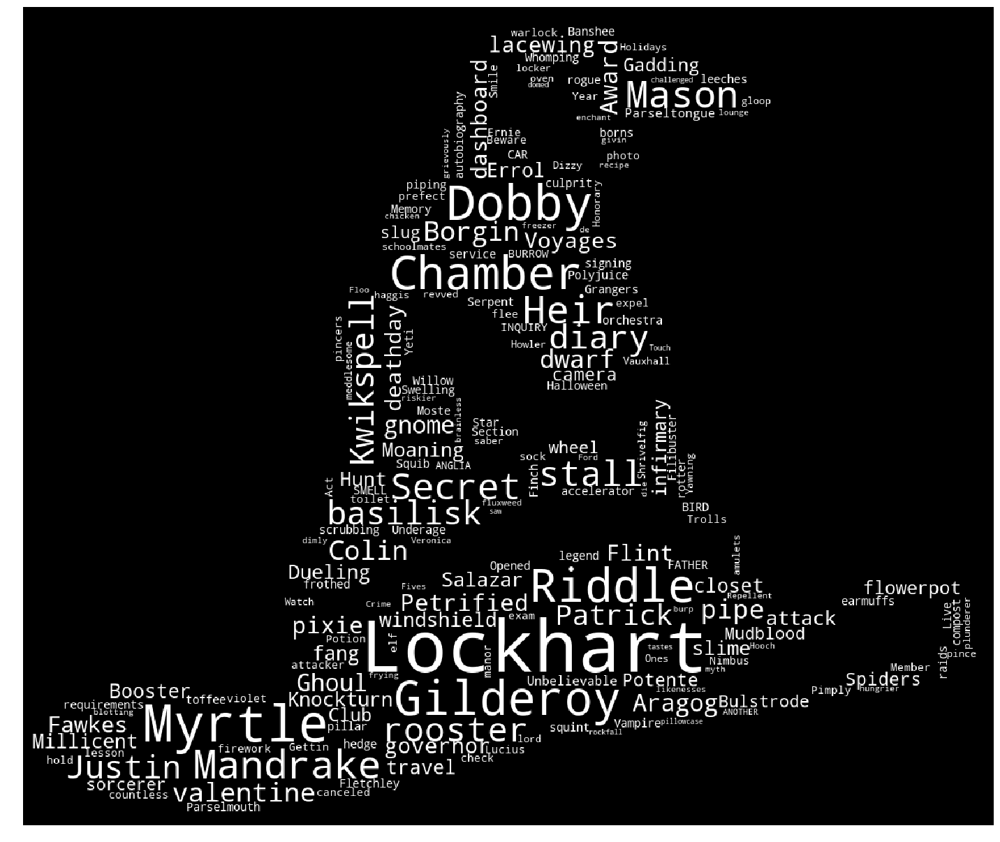

<Figure size 432x288 with 0 Axes>

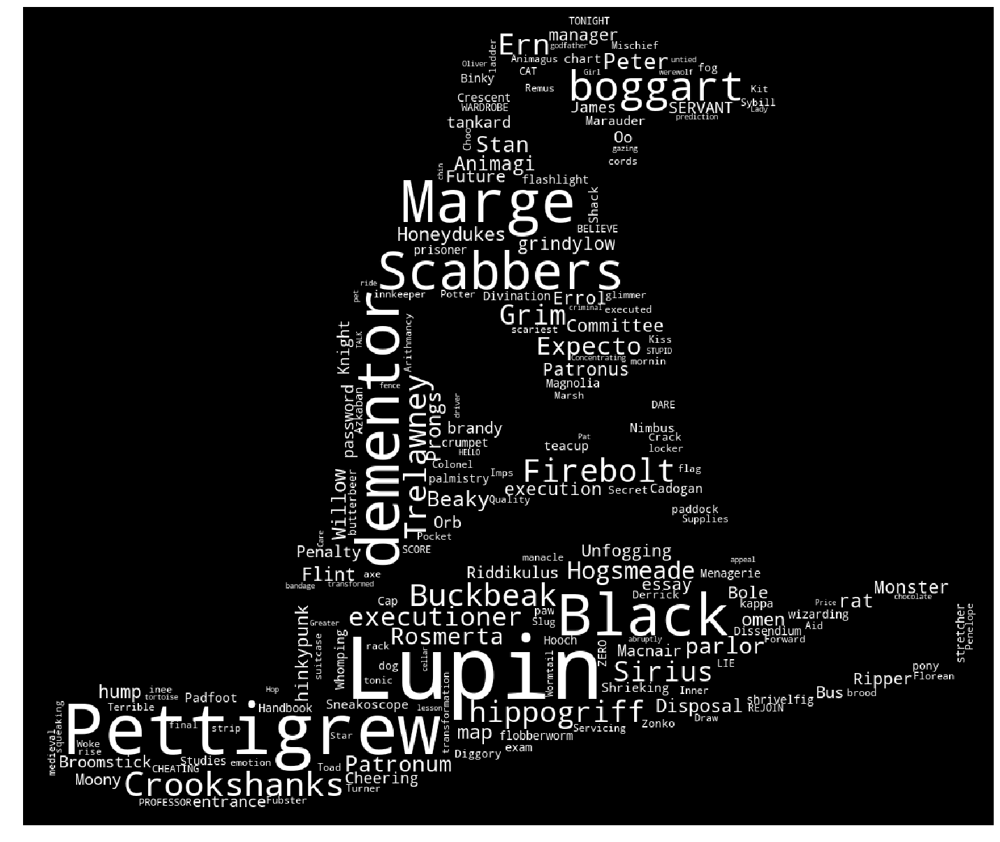

<Figure size 432x288 with 0 Axes>

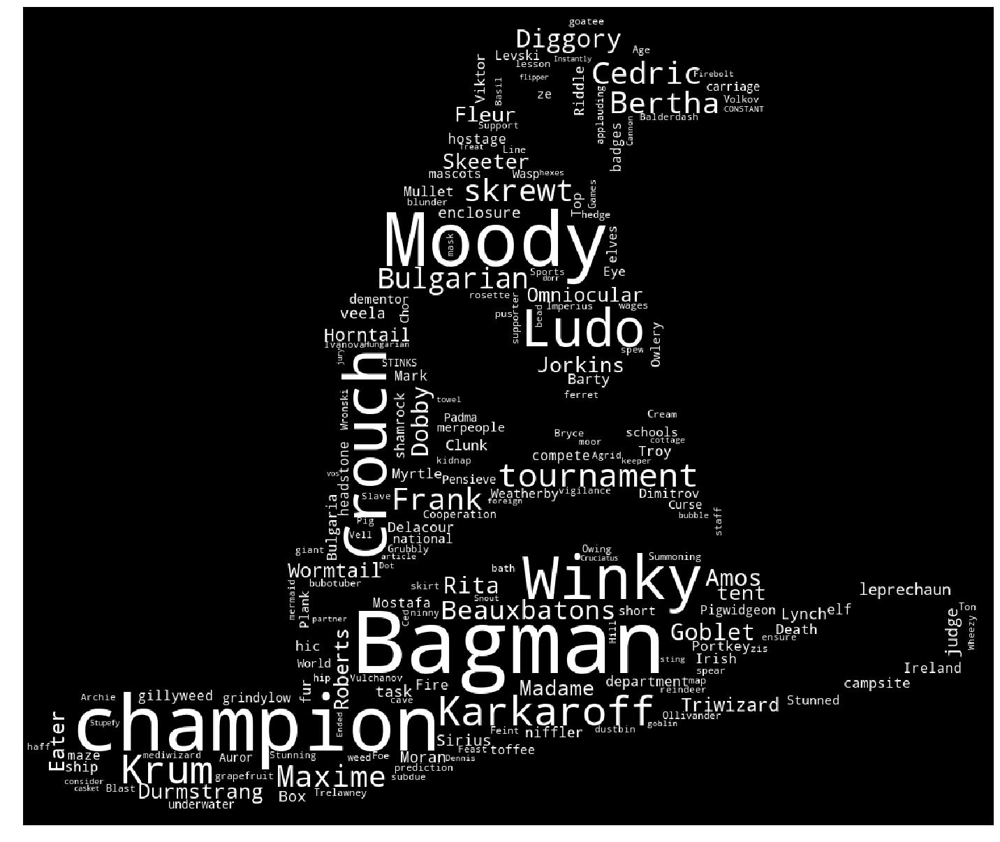

<Figure size 432x288 with 0 Axes>

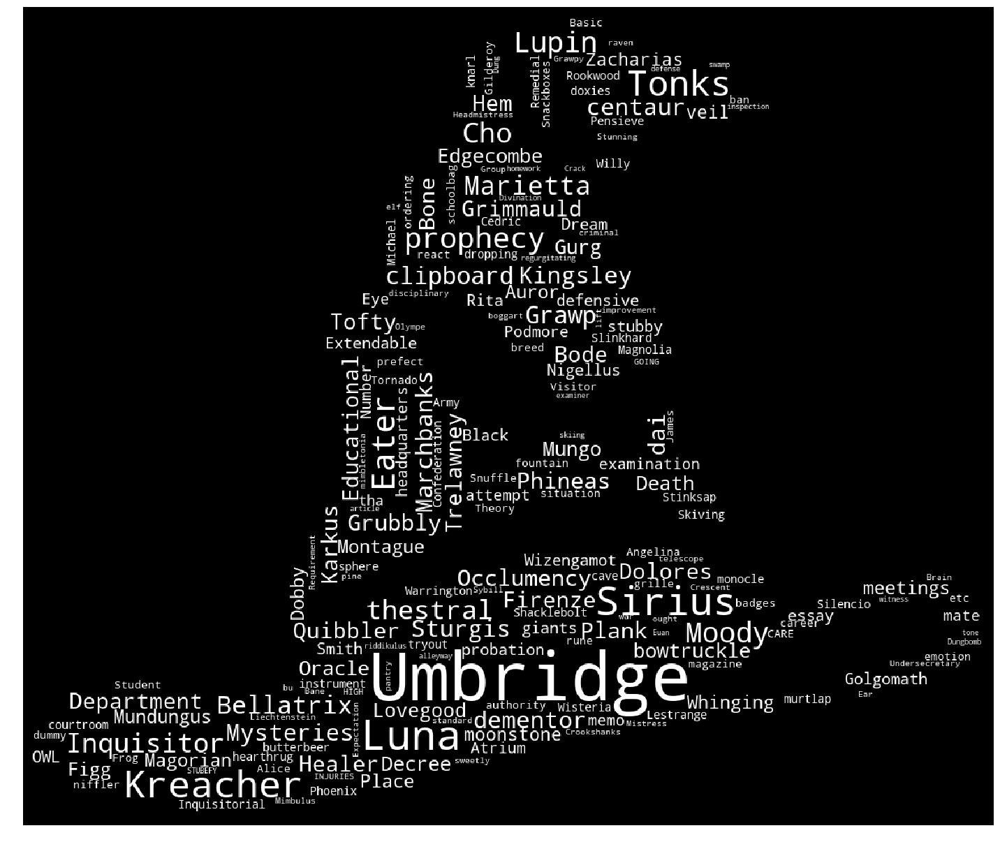

<Figure size 432x288 with 0 Axes>

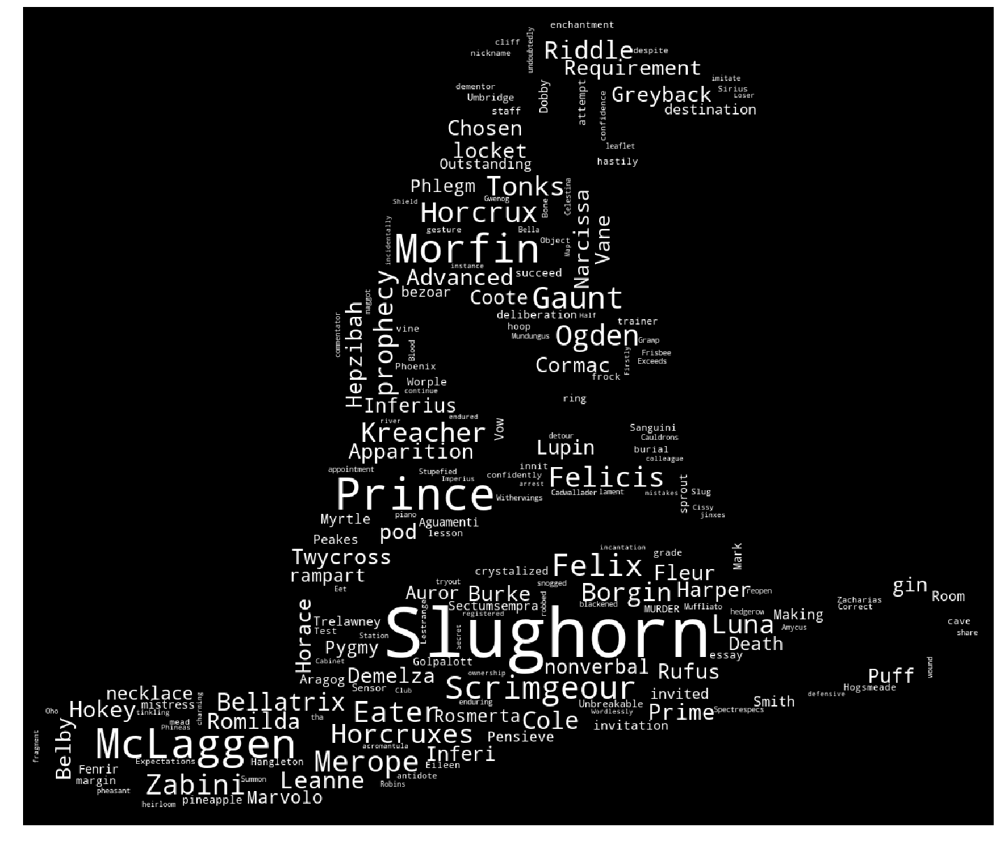

<Figure size 432x288 with 0 Axes>

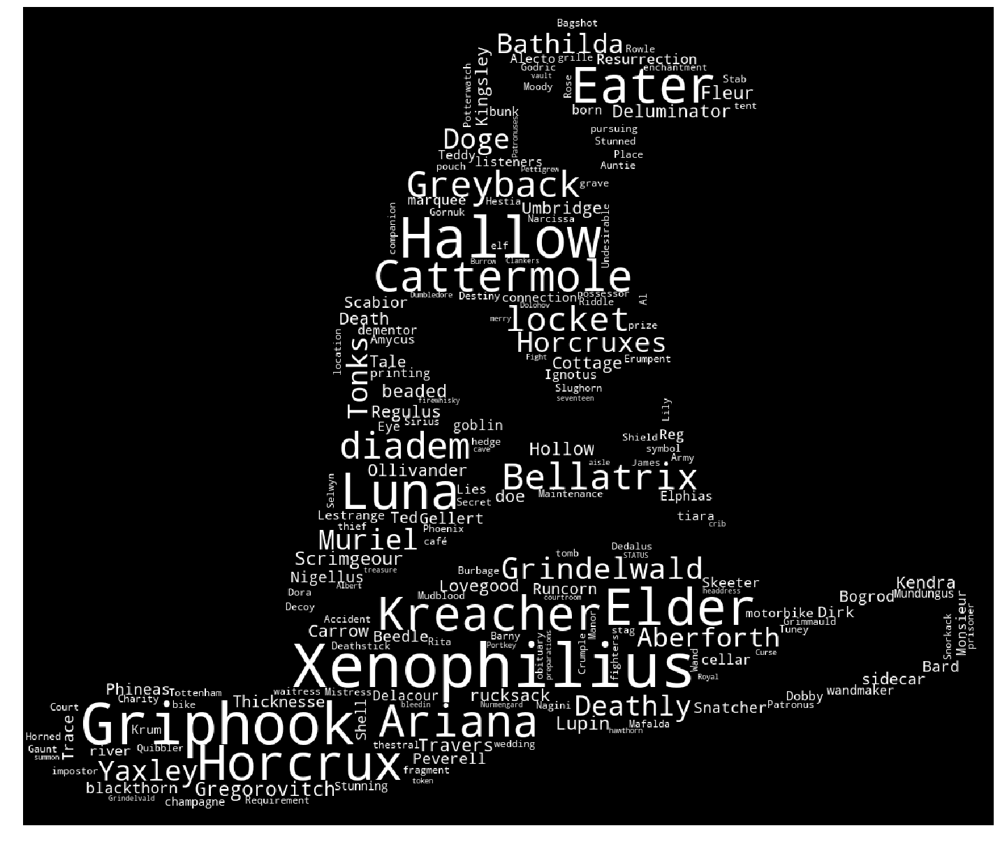

In [100]:
white = "#ffffff"
for index, j in enumerate(CL):
    display_cloud(j, white, stop_words=stop_words, title="book"+str(index+1))

## 3.2 Sentiments

In [101]:
#sentiment for dialog in the chapters chapters
def sentchap(chpX):
    senchp = []
    for chap in chpX:
        senchp.append(sentiment_dilog(dialog(chap)))
    return senchp

In [102]:
def remove_values_from_list(the_list, val):
    while val in the_list:
        the_list.remove(val)

In [103]:
def avesentchp(senchpX):
    senchp = []
    for i in senchpX:
        remove_values_from_list(i,0)
        senchp.append(np.mean(i))
    return senchp

In [104]:
#Sent of chapter according to dialog.
avesent = []
for books in chp:
    avesent.append(avesentchp(sentchap(books)))

C:\Users\Jan\Anaconda3\envs\socialGraphs\lib\site-packages\numpy\core\fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\Jan\Anaconda3\envs\socialGraphs\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [105]:
#sentiment of chapters
chapsent = []
for chap in chp:
    sentimen = []
    for each in chap:
        sentimen.append(sentiment(each))
    chapsent.append(sentimen)

In [106]:
def display_sentiment(x,y,labels, lable_locations, title="sent"):
    disp_color = "black"
    fig = plt.figure(figsize=(20,8))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.plot(x,y, color=ravenclaw)
    for book in lable_locations:
        plt.axvline(x=book, color="black")
    plt.xticks(lable_locations, labels,rotation=90, color= disp_color)
    plt.ylabel("Average Sentiment", color=disp_color)
    plt.tight_layout()
    plt.savefig("../plots/sentimants/" + title + ".png", format="PNG", transparent=True, bbox_inches="tight")

    plt.show

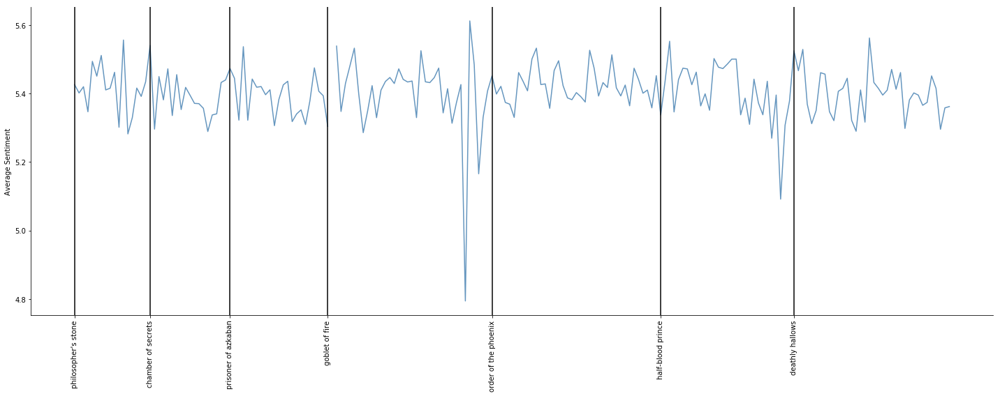

In [107]:
book_names = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows", 
]

y = []
book_start = []
for index, book_by_chapters  in enumerate(avesent):
    y += book_by_chapters
    if not book_start:
        book_start.append(0)
    else:
        book_start.append(book_start[index-1]+len(avesent[index-1]))
    
x_v = range(len(y))

display_sentiment(x_v,y,labels=book_names, lable_locations=book_start, title="sentChap")

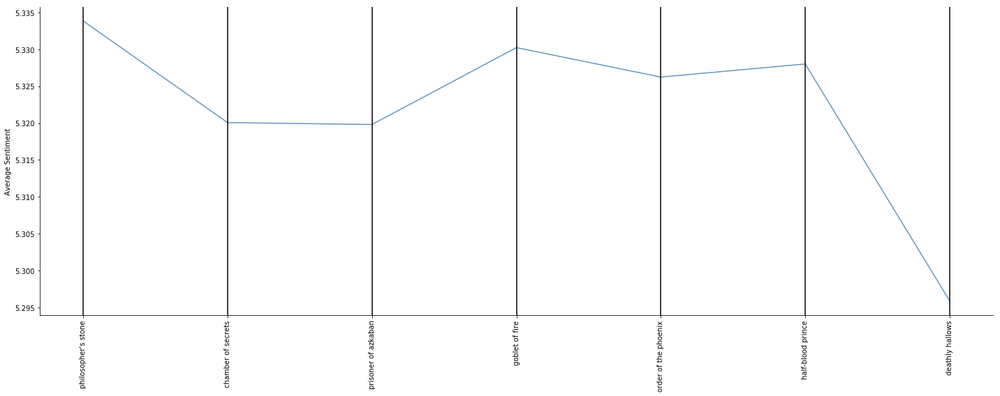

In [108]:
book_sentiments = [
    5.33385911817,
    5.32007207254,
    5.31981087567,
    5.33023696409,
    5.32624551042,
    5.3280163771,
    5.29587962731
]
x_2 = range(len(book_sentiments))
display_sentiment(x_2,book_sentiments, labels=book_names, lable_locations=x_2, title="sentBook")

In [109]:
book_sentiments

[5.33385911817,
 5.32007207254,
 5.31981087567,
 5.33023696409,
 5.32624551042,
 5.3280163771,
 5.29587962731]

In [110]:
for l in avesent:
    print(len(l))

17
18
22
37
38
30
36


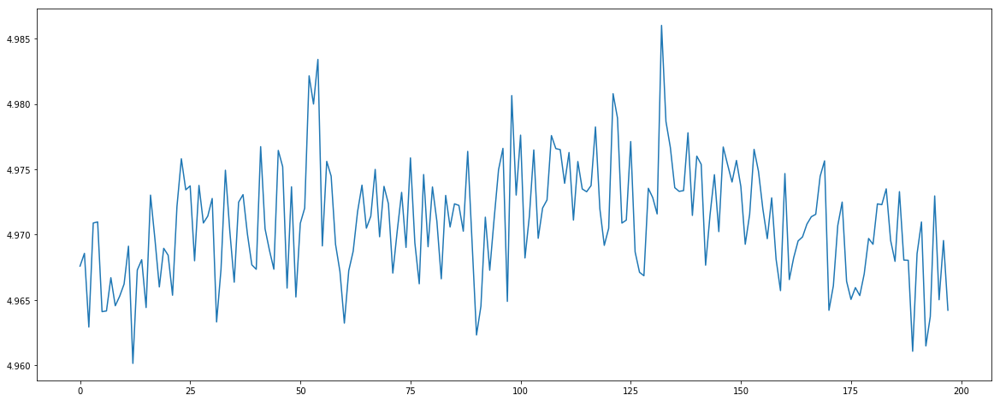

In [111]:
y = []
for book_by_chapters in chapsent:
    y += book_by_chapters
x = range(len(y))

fig = plt.figure(figsize=(20,8))
plt.plot(x,y)

In [112]:
text = nltk.Text(book[0]+book[1]+book[2]+book[3]+book[4]+book[5]+book[6])

In [113]:
from nltk.util import bigrams

In [114]:
def generate_collocations(tokens):
    '''
    Given list of tokens, return collocations.
    '''
    ignored_words = nltk.corpus.stopwords.words('english')
    bigram_measures = nltk.collocations.BigramAssocMeasures()

    # Best results with window_size, freq_filter of: (2,1) (2,2) (5,1)
    finder = nltk.collocations.BigramCollocationFinder.from_words(tokens, window_size = 2)
    finder.apply_word_filter(lambda w: len(w) < 3 or w.lower() in ignored_words)
    finder.apply_freq_filter(1)

    colls = finder.nbest(bigram_measures.likelihood_ratio, 100)

    return colls 

In [115]:
books = tokenize_list(book)
#books[6]

In [116]:
#generate_collocations(books[0])

In [117]:
files = [
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt",
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt",
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt",
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt",
    "HP5.txt",
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt",
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt",
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt" 
]

In [118]:
scenes = []
for script_name in files:
    with open("../movieScripts/" + script_name) as f:
        script = f.read()
        scenes.append(script.split("_START OF NEW SCENE_")[1:])

In [119]:
scenesent = []
for chap in scenes:
    sentim = []
    for each in chap:
        sentim.append(sentiment(each))
    scenesent.append(sentim)

In [120]:
def display_sentiment_scene(x,y,labels, lable_locations):
    disp_color = "black"
    fig = plt.figure(figsize=(20,8))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.plot(x,y, color=ravenclaw)
    for book in lable_locations:
        plt.axvline(x=book, color=disp_color)
    plt.ylim(4.8,5.1)
    plt.xticks(lable_locations, labels,rotation=90, color= disp_color)
    plt.ylabel("Average Sentiment", color=disp_color)
    plt.tight_layout()
    plt.savefig("../plots/sentimants/sentScenes.png", format="PNG", transparent=True, bbox_inches="tight")
    plt.show

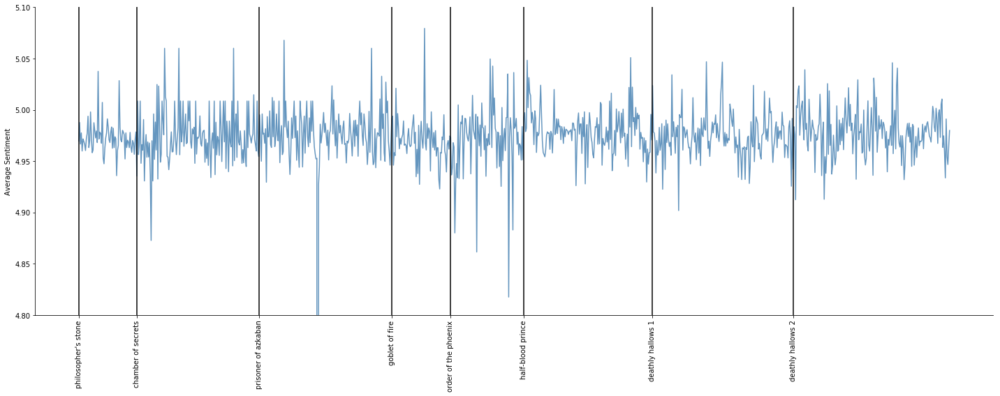

In [121]:
book_names = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"   
]
y = []
book_start = []
for index, book_by_chapters  in enumerate(scenesent):
    y += book_by_chapters
    if not book_start:
        book_start.append(0)
    else:
        book_start.append(book_start[index-1]+len(scenesent[index-1]))
    
x_v = range(len(y))

display_sentiment_scene(x_v,y,labels=book_names, lable_locations=book_start)

## 4 Discussion

### What went well?

We managed to use a broad spectrum of tools to take a deeper look at the Harry Potter series. Creating the movie networks was a challenge but the result turned out quite well and it's interesting to move from a holistic view of the universe to something that changes over time. It was also challenging to present those changes, but the plots that show the edges and nodes of the networks over time and the overview that shows which movies a character was important in also do a great job of showing the progress of the series. The results do not challenge our impressions of the movies that much, but at least the seam plausible according to our knowledge of the domain.

The TF-IDF worked quite well to extract the essence of each book and looking at the word cloud evokes a sense of familiarity
that brings the major plot lines back to mind.

working on this project was over all a fun experienced and it was interesting to the tools of this course on a familiar subject.

### What is still missing? What could be improved?, Why?

An interesting thing to do would be trying utilize the information about which characters are talking in the scenes and which characters they are talking to and about to generate directed networks, but this is very difficult as the scripts are not uniform in their format and would require further clean up, likely manual.
It would be interesting to see how much of a difference it would make to include information about directions and the networks are small enough to overview them and potentially see the differences in the structure and not only in the statistics. 
The fan Wiki also contains information about a character was birth and death. Those dates could be used to construct
networks from the Wiki data that are limited to certain eras e.g. Harry's parent's school days, Dumbledore's youth or the foundation of Hogwarts, further bearking down the universe.

We also didn’t fully realize our vision towards the book analysis. We wanted to take a closer look at collocations and see popular spells and objects as many of them are composed of two words (invisibility cloak, Wingardium Leviosa, flying car, etc.), but the character names were just too dominant and there wasn’t enough to clean the books in order to get more interesting results.

The sentiment analysis was similarly not as fruitful as hoped as the values all are pretty similar within the range of 5.6 and 4.8. Which over all means that the language is fairly balanced.
This is also partly because of the dataset that was used to do the sentiment analysis, which is more geared towards social media than to fiction.
An interesting idea for more sentiment work would be to look at each characters Wiki page and calculate a sentiment from that and contrast as see how well it is suited to detect the heroes and villains of the Harry Potter universe. 

It was also challenging to present the illustrations structured and easy to overview because of the amount of networks and related graphs. The layout of the homepage could be improved to be more user friendly. 